GAN generator using (Lee, 2017) and (Sricharan, 2018). Based on DCGAN architecture with standard GAN loss or Wassertstein loss.

### Setup

In [1]:
COLAB = False
if COLAB:
    from google.colab import drive
    drive.mount('/content/gdrive')
    DRIVE_PATH = F'/content/gdrive/My Drive/evaluation-pipeline/' # Path to data on Google Drive
    REPO_PATH = F'/content/evaluation-pipeline/'
else:
    DRIVE_PATH = F'' # Local path
    REPO_PATH = ''


#import importlib.util
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
if COLAB:
    !git clone -b development https://github.com/lovis-heindrich/evaluation-pipeline.git

Cloning into 'evaluation-pipeline'...
remote: Enumerating objects: 210, done.
remote: Counting objects: 100% (210/210), done.
remote: Compressing objects: 100% (163/163), done.
remote: Total 459 (delta 133), reused 92 (delta 47), pack-reused 249
Receiving objects: 100% (459/459), 175.49 MiB | 26.12 MiB/s, done.
Resolving deltas: 100% (280/280), done.


In [3]:
if COLAB:
    %cd /content/evaluation-pipeline
    !git pull

/content/evaluation-pipeline
Already up to date.


In [4]:
import torch
from torch import nn, optim
import torch.nn.functional as F
from matplotlib import pyplot as plt


load_model = False # Load old model instead of training
save_model = False # Overwrite old model after training
use_gpu = True

import sys

device = torch.device("cuda:0" if torch.cuda.is_available() and use_gpu else "cpu")
print(device)

# Import local files from github
sys.path.append(REPO_PATH+"src")
import utils
from train import train
import gan
import models

cuda:0


In [0]:
num_channels = 3
batch_size = 96
image_size = 64
noise_size = 100
num_epochs = 60
num_classes = 14
beta = 1 

In [0]:
# Init cure tsd dataset
import cure_tsd_loader
path = DRIVE_PATH+"Data/cure_tsd_64x64.npz"
trainloader, testloader, trainset, testset, data = cure_tsd_loader.get_dataloader(path, 0.85, batch_size, normalize=True)

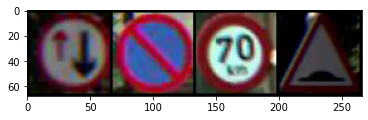

[10, 4, 0, 7]


In [0]:
for _, data in enumerate(trainloader):
    examples, labels = data[0].to(device), data[1].to(device)
    utils.gridshow(examples.detach()[0:4,:,:,:], True)
    print([labels[i].item() for i in range(4)])
    break

### GAN functions

In [0]:
loss = nn.BCELoss()
c_loss = nn.CrossEntropyLoss()

In [0]:
def initGAN(conditional=True, lee=True, wgan=False):
    if conditional:
        generator = gan.CGenerator(noise_size, num_channels)
        discriminator = gan.CDiscriminator(num_channels, wgan=wgan)
    else:
        generator = gan.Generator(noise_size, num_channels)
        discriminator = gan.Discriminator(num_channels, wgan=wgan)
        
    discriminator.to(device)
    generator.to(device)

    d_optimizer = optim.Adam(discriminator.parameters(), 0.0002, (0.5, 0.999))
    g_optimizer = optim.Adam(generator.parameters(), 0.0002, (0.5, 0.999))

    if lee:
        classifier = gan.Classifier(num_channels, num_classes)
        classifier.to(device)
        c_optimizer = optim.Adam(classifier.parameters(), 0.0002)
        train(classifier, c_optimizer, c_loss, 1, trainloader, testloader, device, True)
        return generator, g_optimizer, discriminator, d_optimizer, classifier, c_optimizer
    
    return generator, g_optimizer, discriminator, d_optimizer, None, None

In [0]:
# Baseline classifier for gan early stopping
def getBaselineClassifier(log=True):
    classifier_baseline = models.BaseClassifier(num_channels, num_classes)
    classifier_baseline.to(device)
    baseline_loss = nn.CrossEntropyLoss()
    baseline_optimizer = torch.optim.Adam(classifier_baseline.parameters(), 0.0002)
    baseline_acc = train(classifier_baseline, baseline_optimizer, baseline_loss, 3, trainloader, testloader, device, log=log)
    return classifier_baseline

In [0]:
def train_discriminator(discriminator, generator, d_optimizer, inputs, labels, batch_size, conditional=True, wgan=False):
    with torch.no_grad():
        if conditional:
            fake_examples = generator(torch.randn(batch_size,noise_size, 1, 1).to(device), labels)
        else:
            fake_examples = generator(torch.randn(batch_size,noise_size, 1, 1).to(device))
        fake_examples = torch.clamp(fake_examples, -1, 1)
    
    # WGAN requires clamped weights
    if wgan:
        for p in discriminator.parameters():
            p.data.clamp_(-0.1, 0.1)

    d_optimizer.zero_grad()


    # Discriminator fake examples
    if conditional:
        outputs = discriminator(fake_examples.view(batch_size, num_channels, image_size, image_size), labels)
    else: 
        outputs = discriminator(fake_examples.view(batch_size, num_channels, image_size, image_size))

    if wgan:
        fake_loss = torch.mean(outputs.view(-1))
    else:
        fake_loss = loss(outputs.view(-1), torch.zeros(batch_size).to(device) + (torch.rand(batch_size).to(device)*0.1))
    #fake_loss.backward()

    # Discriminator real examples
    if conditional:
        outputs = discriminator(inputs, labels)
    else:
        outputs = discriminator(inputs)
    if wgan:
        real_loss = -1*torch.mean(outputs.view(-1))
    else:
        real_loss = loss(outputs.view(-1), torch.ones(inputs.shape[0]).to(device) - (torch.rand(inputs.shape[0]).to(device)*0.1))
    #real_loss.backward()

    d_loss = real_loss + fake_loss
    d_loss.backward()
    # Discriminator update
    d_optimizer.step()
    return d_loss.detach().item()#fake_loss + real_loss

def train_generator(discriminator, generator, g_optimizer, labels, batch_size, classifier=None, sricharan=False, uniform=None, conditional=True, lee=False, wgan=False):
    g_optimizer.zero_grad()
    # Standard Generator GAN loss
    if conditional:
        fake_examples = generator(torch.randn(batch_size, noise_size, 1, 1).to(device), labels)
        fake_examples = torch.clamp(fake_examples, -1, 1)
        outputs = discriminator(fake_examples.view(batch_size, num_channels, image_size, image_size), labels)
    else:
        fake_examples = generator(torch.randn(batch_size, noise_size, 1, 1).to(device))
        fake_examples = torch.clamp(fake_examples, -1, 1)
        outputs = discriminator(fake_examples.view(batch_size, num_channels, image_size, image_size))
    if wgan:
        gen_loss = -1*torch.mean(outputs.view(-1))
    else:
        gen_loss = loss(outputs.view(-1), torch.ones(batch_size).to(device) - (torch.rand(batch_size).to(device)*0.1))

    # Generator KL loss
    if lee:
        preds = classifier(fake_examples)
        p_model = F.log_softmax(preds, 1)
        kl_loss = F.kl_div(p_model, uniform) * num_classes
        total_gen_loss = gen_loss + beta * kl_loss
        if sricharan:
            total_gen_loss *= -1
    else:
        total_gen_loss = gen_loss
    
    total_gen_loss.backward()
    # Generator update
    g_optimizer.step()
    return total_gen_loss.detach().item(), fake_examples

def train_classifier(classifier, generator, c_optimizer, inputs, labels, batch_size, uniform=None, conditional=True):
    if conditional:
        fake_examples = generator(torch.randn(batch_size,noise_size, 1, 1).to(device), labels)
    else:
        fake_examples = generator(torch.randn(batch_size,noise_size, 1, 1).to(device))
    fake_examples = torch.clamp(fake_examples, -1, 1)
    c_optimizer.zero_grad()

    # Classifier fake examples
    outputs = classifier(fake_examples.view(batch_size, num_channels, image_size, image_size))
    softmax_outputs = F.log_softmax(outputs, 1)
    kl_loss = F.kl_div(softmax_outputs, uniform)* num_classes

    # Classifier real examples
    outputs = F.log_softmax(classifier(inputs), 1)
    class_loss = F.nll_loss(outputs, labels)
    total_loss = class_loss + beta * kl_loss
    total_loss.backward()

    # Classifier update
    c_optimizer.step()
    return total_loss

def generate_examples(generator, n, labels=None, conditional=False):
    with torch.no_grad():
        generator.eval()
        if conditional:
            x = generator(torch.randn(n, noise_size, 1, 1).to(device), labels[:n].to(device)).to("cpu")
        else:
            x = generator(torch.randn(n, noise_size, 1, 1).to(device)).to(device).to("cpu")
        return x

In [0]:
def trainGAN(generator, g_optimizer, discriminator, d_optimizer, n, classifier=None, c_optimizer=None, baseline=None, use_baseline=False, sricharan=False, conditional=True, lee=False, discriminator_steps=5, wgan=False, early_stopping=1, classifier_stopping=0):
    # Reset matplotlib style
    plt.rcParams.update(plt.rcParamsDefault)
    %matplotlib inline

    d_running_losses = []
    g_running_losses = []
    if lee:
        c_running_losses = []
    if use_baseline:
        baseline_acc = []
        baseline_act = []

    for epoch in range(n):
        d_running_loss = 0.0
        g_running_loss = 0.0
        if lee:
            c_running_loss = 0.0
        n_batches = 0
        if use_baseline:
            total = 0.0
            correct = 0.0
            activations = []
        for i, data in enumerate(trainloader, 0):
            # Get the inputs; data is a list of [inputs, labels]
            inputs, labels = data[0].to(device), data[1].to(device)

            batch_size = inputs.shape[0]
            uniform = torch.Tensor(batch_size, num_classes).fill_((1./num_classes)).to(device)

            # Train discriminator every n batches
            if i%discriminator_steps == 0:
                d_running_loss += train_discriminator(discriminator, generator, d_optimizer, inputs, labels, batch_size, conditional=conditional, wgan=wgan)

            # Train generator
            g_loss, fake_examples = train_generator(discriminator, generator, g_optimizer, labels, batch_size, classifier=classifier, uniform=uniform, conditional=conditional, sricharan=sricharan, lee=lee, wgan=wgan)
            g_running_loss += g_loss

            # Train classifier
            if lee:
                c_running_loss += train_classifier(classifier, generator, c_optimizer, inputs, labels, batch_size, uniform=uniform, conditional=conditional)
            
            # Check baseline accuracy on GAN
            if use_baseline:
                with torch.no_grad():
                    output, activation, predicted = baseline.get_prediction(fake_examples) 
                    correct += (predicted == labels).sum().item()
                    activations.append(activation)
                    total += labels.shape[0]
            # check for nan
            #if torch.isnan(fake_examples.view(-1)).sum().item() + torch.isnan(outputs.view(-1)).sum().item() > 0:
            #    print("NAN IN CLASSIFIER:", torch.isnan(outputs.view(-1)).sum().item())
            #    print("NAN IN GENERATOR:", torch.isnan(fake_examples.view(-1)).sum().item())
            #    break

            n_batches += 1
        print('[%d] discriminator loss: %.3f' %
                (epoch + 1, d_running_loss / n_batches))
        print('[%d] generator loss: %.3f' %
                (epoch + 1, g_running_loss / n_batches))
        d_running_losses.append(d_running_loss / n_batches)
        g_running_losses.append(g_running_loss / n_batches)
        if lee:
            print('[%d] classifier loss: %.3f' %
                    (epoch + 1, c_running_loss / n_batches))
            
            c_running_losses.append(c_running_loss / n_batches)
            if (c_running_loss / n_batches) < classifier_stopping:
                print("Stopping")
                break
        if use_baseline:
            print("Classifier accuracy on GAN:", correct/total, "Activation:", torch.mean(torch.cat(activations).to("cpu")).item())
            baseline_acc.append(correct/total)
            baseline_act.append(torch.mean(torch.cat(activations).to("cpu")).item())

            if correct/total > early_stopping:
                print("Stopping...")
                break
        utils.gridshow(inputs.to("cpu")[0:16,:,:,:], True)
        #Save images per epoch
        #img_per_epoch.append(torch.clamp(fake_examples.view(batch_size, num_channels, image_size, image_size).detach().to("cpu"), -1, 1)[0,:,:,:] / 2 + 0.5)
        utils.gridshow(torch.clamp(fake_examples.view(batch_size, num_channels, image_size, image_size).detach().to("cpu"), -1, 1)[0:32,:,:,:], True)
    res = {"Discriminator loss": d_running_losses,
           "Generator loss": g_running_losses}
    if lee:
        res["Lee classifier loss"] = c_running_losses
    if use_baseline:
        res["Baseline accuracy"] = baseline_acc
        res["Baseline activation"] = baseline_act
    models = {
        "generator": generator,
        "discriminator": discriminator,
        "classifier": classifier
    }
    return res, models

In [0]:
def run_experiment(n=2, conditional=False, use_baseline=False, lee=False, wgan=False, sricharan=False, early_stopping=1, classifier_stopping=0):
    print("Config: n={}, conditional={}, use_baseline={}, lee={}, wgan={}, sricharan={}".format(n, conditional, use_baseline, lee, wgan, sricharan))
    if use_baseline:
        print("Training baseline")
        baseline_classifier = getBaselineClassifier()
    else:
        baseline_classifier = None
    print("Init GAN")
    generator, g_optimizer, discriminator, d_optimizer, classifier, c_optimizer = initGAN(conditional=conditional, lee=lee, wgan=wgan)
    print("Train GAN")
    res = trainGAN(generator, g_optimizer, discriminator, d_optimizer, n, classifier=classifier, c_optimizer=c_optimizer, baseline=baseline_classifier, use_baseline=use_baseline, conditional=conditional, sricharan=sricharan, lee=lee, wgan=wgan, early_stopping=early_stopping, classifier_stopping=classifier_stopping)
    return res


In [0]:
def plot_results(res):
    plt.style.use("seaborn")
    for key in list(res.keys()):
        plt.clf()
        plt.plot(range(len(res[key])), res[key], marker='', color='red', linewidth=2, label=key)
        #plt.title("Generator loss")
        plt.legend()
        plt.show()

def save_generator(res, params, gans, name):
    generator = gans["generator"]
    params["num_channels"] = num_channels
    params["noise_size"] = noise_size
    params["num_classes"] = num_classes
    save_res = {"res": res, "params": params, "generator": generator.to("cpu").state_dict()}
    torch.save(save_res, DRIVE_PATH+"Data/models/gan/" + name + ".pt")


#### Example images for training process

In [0]:
img_per_epoch = []

params = {"n": 30, "conditional": True, "use_baseline": True, "lee":True, "wgan":False, "sricharan":False, "early_stopping":1}
res, gans = run_experiment(**params)

torch.Size([30, 3, 64, 64])


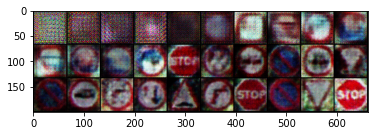

In [24]:
import torchvision
imgs = torch.stack(img_per_epoch)
print(imgs.shape)
imgs = torchvision.utils.make_grid(imgs, 10)
torchvision.utils.save_image(imgs, DRIVE_PATH + "Images_thesis/gan_training.png")

### Conditional Lee

Config: n=15, conditional=True, use_baseline=True, lee=True, wgan=False, sricharan=False
Training baseline
Epoch 1 Accuracy: 0.9769345238095238
Epoch 2 Accuracy: 0.9851190476190477
Epoch 3 Accuracy: 0.9828869047619048
Init GAN
Epoch 1 Accuracy: 0.9739583333333334
Train GAN


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2247: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."


[1] discriminator loss: 0.685
[1] generator loss: 2.141
[1] classifier loss: 0.090
Classifier accuracy on GAN: 0.11108193277310924 Activation: 0.4537709355354309


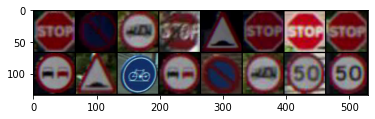

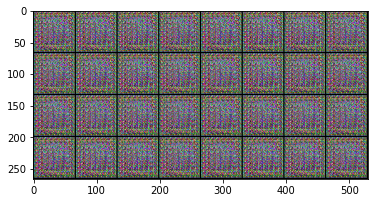

[2] discriminator loss: 0.482
[2] generator loss: 2.571
[2] classifier loss: 0.041
Classifier accuracy on GAN: 0.10701155462184873 Activation: 0.5370898842811584


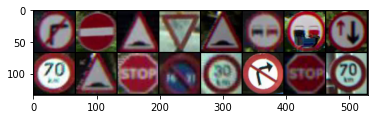

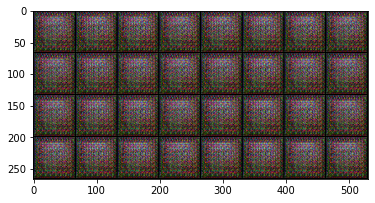

[3] discriminator loss: 0.275
[3] generator loss: 2.142
[3] classifier loss: 0.047
Classifier accuracy on GAN: 0.10097163865546219 Activation: 0.5713520646095276


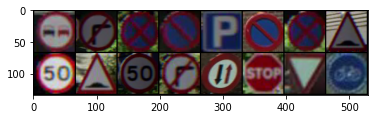

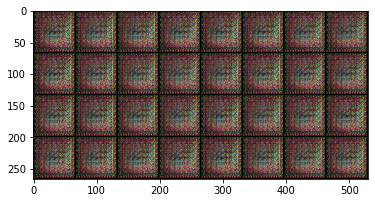

[4] discriminator loss: 0.179
[4] generator loss: 2.167
[4] classifier loss: 0.106
Classifier accuracy on GAN: 0.10477941176470588 Activation: 0.5521302819252014


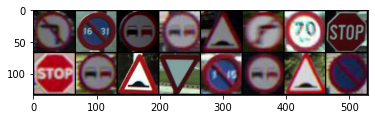

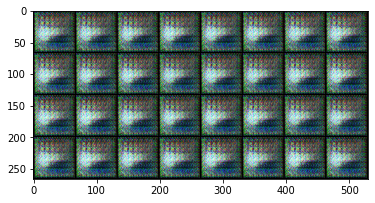

[5] discriminator loss: 0.261
[5] generator loss: 1.316
[5] classifier loss: 0.044
Classifier accuracy on GAN: 0.1053046218487395 Activation: 0.6914373636245728


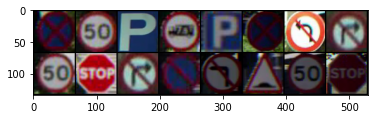

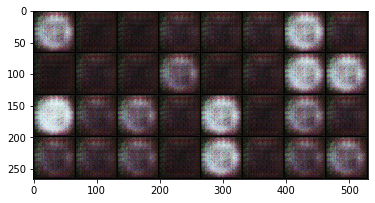

[6] discriminator loss: 0.284
[6] generator loss: 0.918
[6] classifier loss: 0.147
Classifier accuracy on GAN: 0.10582983193277311 Activation: 0.7270432710647583


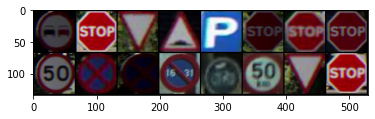

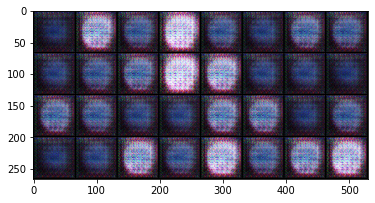

[7] discriminator loss: 0.276
[7] generator loss: 1.031
[7] classifier loss: 0.046
Classifier accuracy on GAN: 0.09978991596638656 Activation: 0.803572416305542


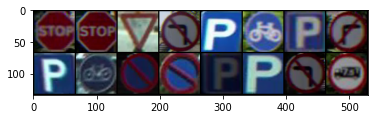

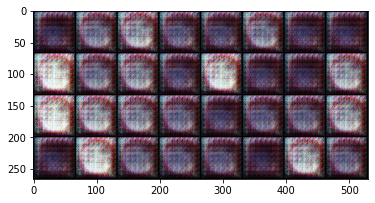

[8] discriminator loss: 0.272
[8] generator loss: 1.011
[8] classifier loss: 0.052
Classifier accuracy on GAN: 0.11410189075630252 Activation: 0.787761926651001


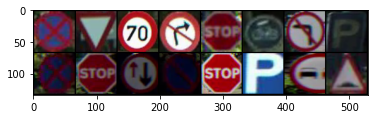

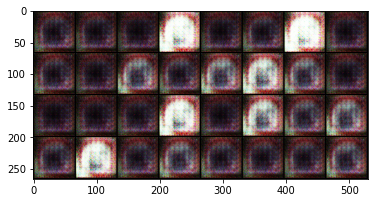

[9] discriminator loss: 0.264
[9] generator loss: 1.281
[9] classifier loss: 0.122
Classifier accuracy on GAN: 0.09269957983193278 Activation: 0.7730813026428223


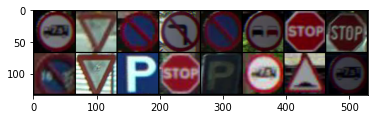

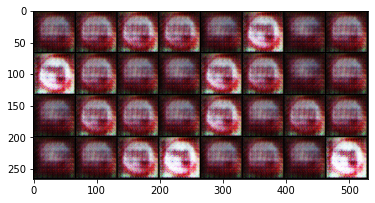

[10] discriminator loss: 0.266
[10] generator loss: 1.271
[10] classifier loss: 0.051
Classifier accuracy on GAN: 0.08941701680672269 Activation: 0.6991049647331238


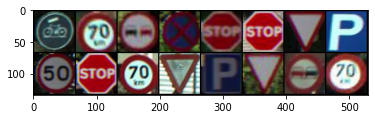

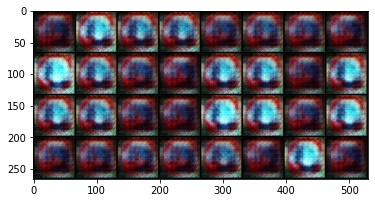

[11] discriminator loss: 0.260
[11] generator loss: 1.365
[11] classifier loss: 0.041
Classifier accuracy on GAN: 0.10110294117647059 Activation: 0.7534303069114685


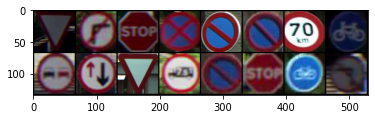

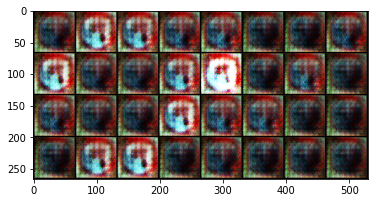

[12] discriminator loss: 0.230
[12] generator loss: 1.542
[12] classifier loss: 0.038
Classifier accuracy on GAN: 0.12316176470588236 Activation: 0.731960117816925


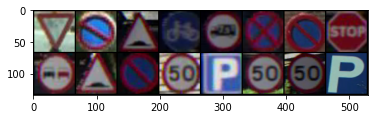

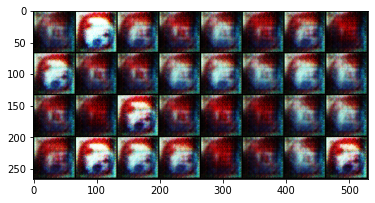

[13] discriminator loss: 0.245
[13] generator loss: 1.505
[13] classifier loss: 0.036
Classifier accuracy on GAN: 0.2712710084033613 Activation: 0.7663410305976868


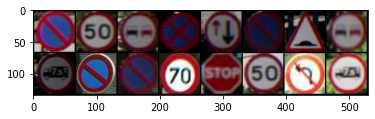

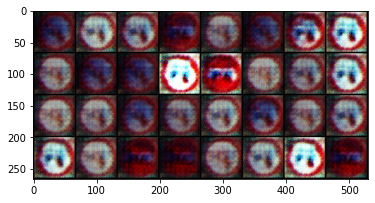

[14] discriminator loss: 0.240
[14] generator loss: 1.245
[14] classifier loss: 0.035
Classifier accuracy on GAN: 0.3283876050420168 Activation: 0.7891894578933716
Stopping...
Done
Config: n=15, conditional=True, use_baseline=True, lee=True, wgan=False, sricharan=False
Training baseline
Epoch 1 Accuracy: 0.9799107142857143
Epoch 2 Accuracy: 0.9836309523809523


KeyboardInterrupt: ignored

In [14]:
for i in range(10):
    params = {"n": 15, "conditional": True, "use_baseline": True, "lee":True, "wgan":False, "sricharan":False, "early_stopping":0.3}
    res, gans = run_experiment(**params)
    #save_generator(res, params, gans, "lee_gan_conditional_" + str(i+1))
    print("Done")

### WGAN Conditional Lee

In [0]:
for i in range(10):
    params = {"n": 40, "conditional": True, "use_baseline": True, "lee":True, "wgan":True, "sricharan":False, "early_stopping":0.3}
    res, gans = run_experiment(**params)
    save_generator(res, params, gans, "lee_wgan_conditional" + str(i+1))
    print("Done")

### WGAN Conditional Sricharan

In [0]:
# Stopping = 0.005
for i in range(10):
    params = {"n": 20, "conditional": True, "use_baseline": True, "lee":True, "wgan":True, "sricharan":True, "classifier_stopping": 0.005}
    res, gans = run_experiment(**params)
    save_generator(res, params, gans, "sricharan_wgan_conditional" + str(i+1))
    print("Done")

In [0]:
# Stopping = 0.002
for i in range(10):
    params = {"n": 20, "conditional": True, "use_baseline": True, "lee":True, "wgan":True, "sricharan":True, "classifier_stopping": 0.002}
    res, gans = run_experiment(**params)
    save_generator(res, params, gans, "sricharan_wgan_002_conditional" + str(i+1))
    print("Done")

In [0]:
# Stopping = 2 epochs
for i in range(10):
    params = {"n": 2, "conditional": True, "use_baseline": True, "lee":True, "wgan":True, "sricharan":True, "classifier_stopping": 0.005}
    res, gans = run_experiment(**params)
    save_generator(res, params, gans, "sricharan_wgan_2e_conditional" + str(i+1))
    print("Done")

### Sricharan conditional GAN

In [0]:
for i in range(10):
    params = {"n": 30, "conditional": True, "use_baseline": True, "lee":True, "wgan":False, "sricharan":True, "classifier_stopping": 0.005}
    res, gans = run_experiment(**params)
    save_generator(res, params, gans, "sricharan_gan_conditional" + str(i+1))
    print("Done")

### Junk

In [0]:
def store_images(n):
    x = generate_examples(generator, n, labels =torch.randint(num_classes, [n]))    
    #utils.gridshow(x[0:32,:,:,:], True)
    #x = x/2 + 0.5
    #torchvision.utils.save_image(x[0:64,:,:,:], "/content/gdrive/My Drive/thesis/Data/lee_gan/lee_10_epoch.png")

In [0]:
# Save GAN examples as OOD dataset to disk
import pickle

def save_to_disk():
    # save examples to disk
    save_name = 'lee_10_epoch.p'
    path = DRIVE_PATH + "Data/lee_gan/"

    with torch.no_grad():
        generator.eval()
        x = generator(torch.randn(2000, noise_size, 1, 1).to(device)).to("cpu")
        imshow(torchvision.utils.make_grid(x[0:32,:,:,:]))

        with open(path+save_name, 'wb') as f:
            pickle.dump(x, f, pickle.HIGHEST_PROTOCOL)

#save_to_disk()

### Simultaneous training test


In [0]:
import ood, ood_loader
from torch.utils.data import TensorDataset, Dataset

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [0]:
pipeline = ood.OodPipeline(1, testset, device)
ood_label = pipeline.get_ood_label()
pipeline_loader = ood_loader.OodLoader(num_channels, image_size, ood_label, device)

In [0]:
class GAN_OOD:
    def __init__(self, gen, conditional, oodlen, noise_size, num_classes, device, ood_label):
        self.generator = gen
        self.conditional = conditional
        self.oodlen = oodlen
        self.noise_size = noise_size
        self.num_classes = num_classes
        self.device = device
        self.ood_label = ood_label

    def get_gan_examples(self, normalize=True):
        if self.conditional:
            x = self.generator(torch.randn(self.oodlen, self.noise_size, 1, 1).to(self.device), torch.randint(self.num_classes, [self.oodlen]).to(self.device)).to("cpu")
        else:
            x = self.generator(torch.randn(self.oodlen, self.noise_size, 1, 1).to(self.device)).to("cpu")
        if normalize:
            x = x / 2 + 0.5
        examples = x.detach()
        ds = TensorDataset(examples, self.ood_label)
        del x
        return ds

In [0]:
def trainGAN_whileTesting(generator, g_optimizer, discriminator, d_optimizer, n, classifier=None, c_optimizer=None, baseline=None, use_baseline=False, sricharan=False, conditional=True, lee=False, discriminator_steps=5, wgan=False, early_stopping=1, classifier_stopping=0):
    # Reset matplotlib style
    plt.rcParams.update(plt.rcParamsDefault)
    %matplotlib inline

    d_running_losses = []
    g_running_losses = []
    ood_res = []
    if lee:
        c_running_losses = []
    if use_baseline:
        baseline_acc = []
        baseline_act = []

    for epoch in range(n):
        d_running_loss = 0.0
        g_running_loss = 0.0
        if lee:
            c_running_loss = 0.0
        n_batches = 0
        if use_baseline:
            total = 0.0
            correct = 0.0
            activations = []
        for i, data in enumerate(trainloader, 0):
            # Get the inputs; data is a list of [inputs, labels]
            inputs, labels = data[0].to(device), data[1].to(device)

            batch_size = inputs.shape[0]
            uniform = torch.Tensor(batch_size, num_classes).fill_((1./num_classes)).to(device)

            # Train discriminator every n batches
            if i%discriminator_steps == 0:
                d_running_loss += train_discriminator(discriminator, generator, d_optimizer, inputs, labels, batch_size, conditional=conditional, wgan=wgan)

            # Train generator
            g_loss, fake_examples = train_generator(discriminator, generator, g_optimizer, labels, batch_size, classifier=classifier, uniform=uniform, conditional=conditional, sricharan=sricharan, lee=lee, wgan=wgan)
            g_running_loss += g_loss

            # Train classifier
            if lee:
                c_running_loss += train_classifier(classifier, generator, c_optimizer, inputs, labels, batch_size, uniform=uniform, conditional=conditional)
            
            # Check baseline accuracy on GAN
            if use_baseline:
                with torch.no_grad():
                    output, activation, predicted = baseline.get_prediction(fake_examples) 
                    correct += (predicted == labels).sum().item()
                    activations.append(activation)
                    total += labels.shape[0]
            # check for nan
            #if torch.isnan(fake_examples.view(-1)).sum().item() + torch.isnan(outputs.view(-1)).sum().item() > 0:
            #    print("NAN IN CLASSIFIER:", torch.isnan(outputs.view(-1)).sum().item())
            #    print("NAN IN GENERATOR:", torch.isnan(fake_examples.view(-1)).sum().item())
            #    break

            n_batches += 1

            # Test OOD performance
            if(n_batches%5 == 0):
                print("\nOOD PIPELINE")
                challenge_gan = GAN_OOD(generator, conditional, pipeline.oodlen, noise_size, num_classes, device, ood_label)
                challenge_data = [ood.ChallengeDataset(None, "Epoch:"+str(epoch)+", Batch:"+str(n_batches+1), generator=challenge_gan, gan=True)]
                ood_partial = pipeline.full_evaluation(getOODBaselineClassifier, challenge_data, 5)
                print(ood_partial)
                ood_res.append(ood_partial[0])

                utils.gridshow(torch.clamp(fake_examples.view(batch_size, num_channels, image_size, image_size).detach().to("cpu"), -1, 1)[0:8,:,:,:], True)
        print("\nEPOCH COMPLETE")
        print('[%d] discriminator loss: %.3f' %
                (epoch + 1, d_running_loss / n_batches))
        print('[%d] generator loss: %.3f' %
                (epoch + 1, g_running_loss / n_batches))
        d_running_losses.append(d_running_loss / n_batches)
        g_running_losses.append(g_running_loss / n_batches)
        if lee:
            print('[%d] classifier loss: %.3f' %
                    (epoch + 1, c_running_loss / n_batches))
            
            c_running_losses.append(c_running_loss / n_batches)
            if (c_running_loss / n_batches) < classifier_stopping:
                print("Stopping")
                break
        if use_baseline:
            print("Classifier accuracy on GAN:", correct/total, "Activation:", torch.mean(torch.cat(activations).to("cpu")).item())
            baseline_acc.append(correct/total)
            baseline_act.append(torch.mean(torch.cat(activations).to("cpu")).item())

            if correct/total > early_stopping:
                print("Stopping...")
                break
        utils.gridshow(inputs.to("cpu")[0:16,:,:,:], True)
        utils.gridshow(torch.clamp(fake_examples.view(batch_size, num_channels, image_size, image_size).detach().to("cpu"), -1, 1)[0:32,:,:,:], True)
    res = {"Discriminator loss": d_running_losses,
           "Generator loss": g_running_losses}
    if lee:
        res["Lee classifier loss"] = c_running_losses
    if use_baseline:
        res["Baseline accuracy"] = baseline_acc
        res["Baseline activation"] = baseline_act
    models = {
        "generator": generator,
        "discriminator": discriminator,
        "classifier": classifier
    }
    return res, models, ood_res

In [0]:
def getOODBaselineClassifier():
    classifier_baseline = models.BaseClassifier(num_channels, num_classes)
    classifier_baseline.to(device)
    c_loss = nn.CrossEntropyLoss()
    c_baseline_optimizer = torch.optim.Adam(classifier_baseline.parameters(), 0.0002)
    baseline_acc = train(classifier_baseline, c_baseline_optimizer, c_loss, 4, trainloader, testloader, device, log=False)
    return classifier_baseline

Training baseline
Init GAN
Epoch 1 Accuracy: 0.9791666666666666
Train GAN


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                     ROC         PR IN  ... MEAN REAL MEAN FAKE        
                    mean     std  mean  ...       std      mean     std
Epoch:0, Batch:6  0.9807  0.0152  0.99  ...     0.005    0.7576  0.2149

[1 rows x 10 columns], [([{'ROC': 0.9746005172902495, 'PR IN': 0.9868397021772052, 'PR OUT': 0.9099878177999923, 'MEAN REAL': 0.9827119708061218, 'MEAN FAKE': 0.8003035187721252}, {'ROC': 0.9854036015447847, 'PR IN': 0.9925308964314735, 'PR OUT': 0.9395909891107177, 'MEAN REAL': 0.9903684258460999, 'MEAN FAKE': 0.8398971557617188}, {'ROC': 0.9963329081632654, 'PR IN': 0.9980833870548237, 'PR OUT': 0.9827940776097772, 'MEAN REAL': 0.9797258377075195, 'MEAN FAKE': 0.3887982666492462}, {'ROC': 0.9574608489229025, 'PR IN': 0.9778864402731444, 'PR OUT': 0.8685095858777407, 'MEAN REAL': 0.9884195327758789, 'MEAN FAKE': 0.9513488411903381}, {'ROC': 0.9895694931618481, 'PR IN': 0.9944559399149048, 'PR OUT': 0.956970792860865, 'MEAN REAL': 0.9912856221199036, 'MEAN FAKE': 0.80768

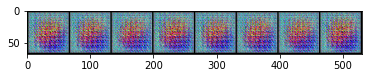

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                     ROC           PR IN  ... MEAN REAL MEAN FAKE        
                    mean     std    mean  ...       std      mean     std
Epoch:0, Batch:11  0.991  0.0084  0.9952  ...    0.0027    0.6314  0.2324

[1 rows x 10 columns], [([{'ROC': 0.9837782118055556, 'PR IN': 0.9916509542956709, 'PR OUT': 0.9365015607287115, 'MEAN REAL': 0.9908275008201599, 'MEAN FAKE': 0.8570066094398499}, {'ROC': 0.9965870137117347, 'PR IN': 0.9981605948628713, 'PR OUT': 0.9845691526697924, 'MEAN REAL': 0.9867719411849976, 'MEAN FAKE': 0.4844404458999634}, {'ROC': 0.996123644770408, 'PR IN': 0.9979755093640608, 'PR OUT': 0.9809125916651574, 'MEAN REAL': 0.9850478768348694, 'MEAN FAKE': 0.43285948038101196}, {'ROC': 0.9982550311791382, 'PR IN': 0.999003382276817, 'PR OUT': 0.9937798264857217, 'MEAN REAL': 0.9904345870018005, 'MEAN FAKE': 0.47117510437965393}, {'ROC': 0.9800756891298186, 'PR IN': 0.9894451904729772, 'PR OUT': 0.9276504028826862, 'MEAN REAL': 0.9907162189483643, 'MEAN FAKE': 

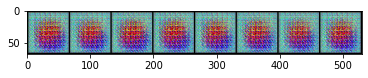

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:16  0.9635  0.0543  0.9806  ...     0.003    0.7726  0.1831

[1 rows x 10 columns], [([{'ROC': 0.9772484188988094, 'PR IN': 0.9882438573598592, 'PR OUT': 0.91722075757211, 'MEAN REAL': 0.9920169711112976, 'MEAN FAKE': 0.9347736239433289}, {'ROC': 0.988135651395975, 'PR IN': 0.9938319947875105, 'PR OUT': 0.9500077200969321, 'MEAN REAL': 0.9895986318588257, 'MEAN FAKE': 0.7476817965507507}, {'ROC': 0.8669953984197846, 'PR IN': 0.9284854058613938, 'PR OUT': 0.7188511112285252, 'MEAN REAL': 0.9845488667488098, 'MEAN FAKE': 0.9862772822380066}, {'ROC': 0.9935383007369616, 'PR IN': 0.9966034800521183, 'PR OUT': 0.9695211567371362, 'MEAN REAL': 0.9867700338363647, 'MEAN FAKE': 0.6020444631576538}, {'ROC': 0.9915608170351474, 'PR IN': 0.9957053674666194, 'PR OUT': 0.960665082368555, 'MEAN REAL': 0.986301600933075, 'MEAN FAKE': 0.

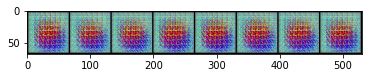

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:21  0.9932  0.0028  0.9963  ...    0.0019    0.5446  0.1077

[1 rows x 10 columns], [([{'ROC': 0.9903954745960885, 'PR IN': 0.9948284058417328, 'PR OUT': 0.960911258045257, 'MEAN REAL': 0.9851838946342468, 'MEAN FAKE': 0.626499354839325}, {'ROC': 0.9933356806264173, 'PR IN': 0.9963116203235379, 'PR OUT': 0.9760061345429073, 'MEAN REAL': 0.9892632961273193, 'MEAN FAKE': 0.6300497055053711}, {'ROC': 0.9905416268069728, 'PR IN': 0.9949392729997646, 'PR OUT': 0.9637212347967608, 'MEAN REAL': 0.9852287173271179, 'MEAN FAKE': 0.5813727974891663}, {'ROC': 0.997101314484127, 'PR IN': 0.9985315157281832, 'PR OUT': 0.9850710465010095, 'MEAN REAL': 0.9856265187263489, 'MEAN FAKE': 0.3710048496723175}, {'ROC': 0.9944617169784581, 'PR IN': 0.9970360438932235, 'PR OUT': 0.9760379827594925, 'MEAN REAL': 0.9884421229362488, 'MEAN FAKE': 

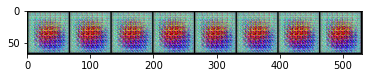

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC          PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std   mean  ...       std      mean     std
Epoch:0, Batch:26  0.9944  0.0033  0.997  ...     0.003    0.5036  0.1111

[1 rows x 10 columns], [([{'ROC': 0.9903484180130385, 'PR IN': 0.9951375193082249, 'PR OUT': 0.956381706232416, 'MEAN REAL': 0.9862212538719177, 'MEAN FAKE': 0.6046512126922607}, {'ROC': 0.9974567300878684, 'PR IN': 0.998596306469897, 'PR OUT': 0.9894804242615187, 'MEAN REAL': 0.9911279678344727, 'MEAN FAKE': 0.5202995538711548}, {'ROC': 0.9951210627480159, 'PR IN': 0.9972103914470021, 'PR OUT': 0.9826202575983574, 'MEAN REAL': 0.9852232336997986, 'MEAN FAKE': 0.48197510838508606}, {'ROC': 0.9975574865362813, 'PR IN': 0.9986516143591372, 'PR OUT': 0.9912614301472047, 'MEAN REAL': 0.9895452260971069, 'MEAN FAKE': 0.3255552053451538}, {'ROC': 0.9916123024730726, 'PR IN': 0.9954558544160641, 'PR OUT': 0.9666681140229758, 'MEAN REAL': 0.983934760093689, 'MEAN FAKE': 0.

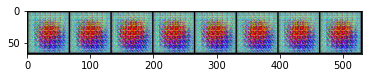

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:31  0.9717  0.0172  0.9851  ...    0.0035    0.7847  0.1959

[1 rows x 10 columns], [([{'ROC': 0.9840497559700964, 'PR IN': 0.9911826461991408, 'PR OUT': 0.9490151458510651, 'MEAN REAL': 0.9846861958503723, 'MEAN FAKE': 0.6990141272544861}, {'ROC': 0.9638649730725624, 'PR IN': 0.9816238667777487, 'PR OUT': 0.880124428298516, 'MEAN REAL': 0.9876073598861694, 'MEAN FAKE': 0.9408946633338928}, {'ROC': 0.9943958377621882, 'PR IN': 0.9968811356130202, 'PR OUT': 0.9778105126032985, 'MEAN REAL': 0.9888244271278381, 'MEAN FAKE': 0.48874062299728394}, {'ROC': 0.951879938173186, 'PR IN': 0.9740915879145303, 'PR OUT': 0.8600623261338642, 'MEAN REAL': 0.988829493522644, 'MEAN FAKE': 0.9638559222221375}, {'ROC': 0.9640936127054989, 'PR IN': 0.9815975110026024, 'PR OUT': 0.8813801529873424, 'MEAN REAL': 0.980748176574707, 'MEAN FAKE': 

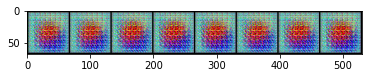

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:36  0.9643  0.0496  0.9813  ...     0.002    0.7045  0.2706

[1 rows x 10 columns], [([{'ROC': 0.8789084644274376, 'PR IN': 0.9361283553671569, 'PR OUT': 0.7328844206416772, 'MEAN REAL': 0.9897310137748718, 'MEAN FAKE': 0.9934306740760803}, {'ROC': 0.9772334715136054, 'PR IN': 0.988201489332389, 'PR OUT': 0.9175761110031039, 'MEAN REAL': 0.985016405582428, 'MEAN FAKE': 0.7873611450195312}, {'ROC': 0.9998333643353174, 'PR IN': 0.9998611665358609, 'PR OUT': 0.9998139070868537, 'MEAN REAL': 0.9897323846817017, 'MEAN FAKE': 0.3849164545536041}, {'ROC': 0.9679716287556688, 'PR IN': 0.9834942949460499, 'PR OUT': 0.8925172011707483, 'MEAN REAL': 0.9870263934135437, 'MEAN FAKE': 0.9009499549865723}, {'ROC': 0.9976338842828798, 'PR IN': 0.9987647344077685, 'PR OUT': 0.9865760296615982, 'MEAN REAL': 0.9881228804588318, 'MEAN FAKE':

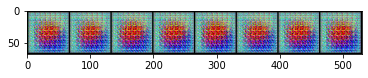

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:41  0.9934  0.0094  0.9966  ...    0.0017    0.5588  0.2042

[1 rows x 10 columns], [([{'ROC': 0.9976482780612245, 'PR IN': 0.9987057568338772, 'PR OUT': 0.9912489321033475, 'MEAN REAL': 0.9906207919120789, 'MEAN FAKE': 0.45777949690818787}, {'ROC': 0.9977457128684807, 'PR IN': 0.9988619621276672, 'PR OUT': 0.9866966448419722, 'MEAN REAL': 0.9878202080726624, 'MEAN FAKE': 0.4591193199157715}, {'ROC': 0.9766837399022109, 'PR IN': 0.9880250203183383, 'PR OUT': 0.9139674300683645, 'MEAN REAL': 0.9908503890037537, 'MEAN FAKE': 0.9233579635620117}, {'ROC': 0.9973222036210319, 'PR IN': 0.9985121733159521, 'PR OUT': 0.988377684088376, 'MEAN REAL': 0.9882787466049194, 'MEAN FAKE': 0.4637766480445862}, {'ROC': 0.9977678571428571, 'PR IN': 0.9988835131086679, 'PR OUT': 0.9867189985328155, 'MEAN REAL': 0.9915557503700256, 'MEAN FAKE

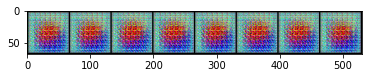

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:46  0.9338  0.1082  0.9645  ...    0.0029    0.7862  0.2164

[1 rows x 10 columns], [([{'ROC': 0.9811369534793084, 'PR IN': 0.9902357442736652, 'PR OUT': 0.9272933600000277, 'MEAN REAL': 0.9886844158172607, 'MEAN FAKE': 0.8637363910675049}, {'ROC': 0.9944905045351473, 'PR IN': 0.9968990574039012, 'PR OUT': 0.9801193432825798, 'MEAN REAL': 0.986411988735199, 'MEAN FAKE': 0.4472629129886627}, {'ROC': 0.7412170271754536, 'PR IN': 0.8603918103667114, 'PR OUT': 0.5909363699503608, 'MEAN REAL': 0.9813488721847534, 'MEAN FAKE': 0.9956483840942383}, {'ROC': 0.9638702323377267, 'PR IN': 0.9810573424591224, 'PR OUT': 0.8831825906173687, 'MEAN REAL': 0.9866953492164612, 'MEAN FAKE': 0.9150100350379944}, {'ROC': 0.9881356513959753, 'PR IN': 0.9939565024792997, 'PR OUT': 0.9497098620498268, 'MEAN REAL': 0.988137423992157, 'MEAN FAKE':

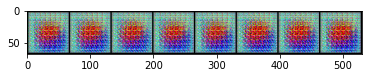

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:51  0.8838  0.2173  0.9332  ...    0.0015    0.7623  0.2179

[1 rows x 10 columns], [([{'ROC': 0.9973006129535147, 'PR IN': 0.9982014720935224, 'PR OUT': 0.99538176815954, 'MEAN REAL': 0.9881259799003601, 'MEAN FAKE': 0.471383273601532}, {'ROC': 0.9903223984906462, 'PR IN': 0.9948182700463478, 'PR OUT': 0.9632172665118808, 'MEAN REAL': 0.9882779717445374, 'MEAN FAKE': 0.6624261140823364}, {'ROC': 0.9481209475977891, 'PR IN': 0.9733921591083754, 'PR OUT': 0.8461177901780688, 'MEAN REAL': 0.9855706691741943, 'MEAN FAKE': 0.9558271169662476}, {'ROC': 0.9866132325325965, 'PR IN': 0.9932804748149354, 'PR OUT': 0.9425823145157244, 'MEAN REAL': 0.9861442446708679, 'MEAN FAKE': 0.7222607135772705}, {'ROC': 0.49666119703089573, 'PR IN': 0.7064624845248345, 'PR OUT': 0.449215897965652, 'MEAN REAL': 0.9889634847640991, 'MEAN FAKE': 

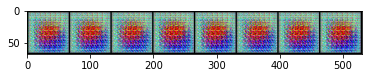

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:56  0.9634  0.0659  0.9807  ...    0.0013    0.7012  0.1836

[1 rows x 10 columns], [([{'ROC': 0.9964331110048187, 'PR IN': 0.99802861400908, 'PR OUT': 0.9873055239799919, 'MEAN REAL': 0.9891101717948914, 'MEAN FAKE': 0.5370609164237976}, {'ROC': 0.845727483701814, 'PR IN': 0.9183217775797756, 'PR OUT': 0.6909379150419988, 'MEAN REAL': 0.9874351024627686, 'MEAN FAKE': 0.994147002696991}, {'ROC': 0.992205215419501, 'PR IN': 0.9960082061250223, 'PR OUT': 0.9669002751124359, 'MEAN REAL': 0.9909611940383911, 'MEAN FAKE': 0.6800628304481506}, {'ROC': 0.9948448129251701, 'PR IN': 0.9973955234188473, 'PR OUT': 0.9751349317716335, 'MEAN REAL': 0.9886619448661804, 'MEAN FAKE': 0.5583414435386658}, {'ROC': 0.9879978032879818, 'PR IN': 0.9937120472983877, 'PR OUT': 0.9509875060172966, 'MEAN REAL': 0.9894016981124878, 'MEAN FAKE': 0.

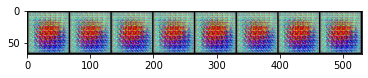

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:61  0.9866  0.0088  0.9931  ...    0.0028    0.7291  0.1909

[1 rows x 10 columns], [([{'ROC': 0.9939114317602041, 'PR IN': 0.9967172967394385, 'PR OUT': 0.9744203511606624, 'MEAN REAL': 0.9838135242462158, 'MEAN FAKE': 0.4371581971645355}, {'ROC': 0.9912225632440477, 'PR IN': 0.9953477577833457, 'PR OUT': 0.9637766480597991, 'MEAN REAL': 0.9879167079925537, 'MEAN FAKE': 0.6774278283119202}, {'ROC': 0.9723883042800454, 'PR IN': 0.9860641266382393, 'PR OUT': 0.9006324764850326, 'MEAN REAL': 0.9872020483016968, 'MEAN FAKE': 0.9029052257537842}, {'ROC': 0.9913415887188207, 'PR IN': 0.9954774711909222, 'PR OUT': 0.9611581804192268, 'MEAN REAL': 0.9896014928817749, 'MEAN FAKE': 0.7327601313591003}, {'ROC': 0.9839575804280045, 'PR IN': 0.9916502700027581, 'PR OUT': 0.9381700205859976, 'MEAN REAL': 0.9911786913871765, 'MEAN FAKE

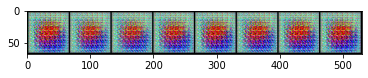

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:66  0.9788  0.0248  0.9891  ...    0.0024    0.6658  0.2258

[1 rows x 10 columns], [([{'ROC': 0.9814746536635488, 'PR IN': 0.9906040105675408, 'PR OUT': 0.927873827240239, 'MEAN REAL': 0.9855079054832458, 'MEAN FAKE': 0.7832691073417664}, {'ROC': 0.9998831889526644, 'PR IN': 0.9998959120503069, 'PR OUT': 0.999875389952291, 'MEAN REAL': 0.9875104427337646, 'MEAN FAKE': 0.32428914308547974}, {'ROC': 0.9909103289753401, 'PR IN': 0.995320539829923, 'PR OUT': 0.9619209621409519, 'MEAN REAL': 0.9876460433006287, 'MEAN FAKE': 0.6174719929695129}, {'ROC': 0.936207881590136, 'PR IN': 0.9668828352778472, 'PR OUT': 0.8239265100585311, 'MEAN REAL': 0.9818839430809021, 'MEAN FAKE': 0.9325003027915955}, {'ROC': 0.985653831845238, 'PR IN': 0.9927075831998172, 'PR OUT': 0.9407884479214039, 'MEAN REAL': 0.9840800166130066, 'MEAN FAKE': 0

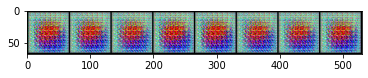

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:71  0.9922  0.0075  0.9959  ...    0.0023    0.5322  0.1887

[1 rows x 10 columns], [([{'ROC': 0.9808961344954648, 'PR IN': 0.9898317305994782, 'PR OUT': 0.9332354398172588, 'MEAN REAL': 0.9859738945960999, 'MEAN FAKE': 0.7774839997291565}, {'ROC': 0.9978946331136622, 'PR IN': 0.998837192052652, 'PR OUT': 0.9897628724858623, 'MEAN REAL': 0.9888494610786438, 'MEAN FAKE': 0.4586639404296875}, {'ROC': 0.9987444196428572, 'PR IN': 0.9992379937832124, 'PR OUT': 0.99432199197021, 'MEAN REAL': 0.9836539626121521, 'MEAN FAKE': 0.28745362162590027}, {'ROC': 0.9884689227253401, 'PR IN': 0.9941416726721319, 'PR OUT': 0.9506681407205073, 'MEAN REAL': 0.9863273501396179, 'MEAN FAKE': 0.6534557342529297}, {'ROC': 0.9948215614370748, 'PR IN': 0.9974005494268384, 'PR OUT': 0.9739519349834739, 'MEAN REAL': 0.983163595199585, 'MEAN FAKE': 

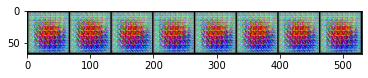

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:76  0.9944  0.0047  0.9971  ...     0.001    0.5652  0.1518

[1 rows x 10 columns], [([{'ROC': 0.9984321853741497, 'PR IN': 0.9990934835889002, 'PR OUT': 0.9963957991403545, 'MEAN REAL': 0.9886125326156616, 'MEAN FAKE': 0.36675089597702026}, {'ROC': 0.9970232559169501, 'PR IN': 0.9985105187847296, 'PR OUT': 0.9830333192920868, 'MEAN REAL': 0.9914360046386719, 'MEAN FAKE': 0.5734372138977051}, {'ROC': 0.9935072987528345, 'PR IN': 0.9966452633059998, 'PR OUT': 0.9706471062523102, 'MEAN REAL': 0.9899430274963379, 'MEAN FAKE': 0.576543927192688}, {'ROC': 0.9965056335034015, 'PR IN': 0.9982000533647033, 'PR OUT': 0.9821756219874851, 'MEAN REAL': 0.9901058673858643, 'MEAN FAKE': 0.5195508003234863}, {'ROC': 0.9866160005668934, 'PR IN': 0.9932845312902063, 'PR OUT': 0.9425546423812908, 'MEAN REAL': 0.9895274043083191, 'MEAN FAKE

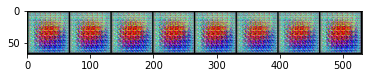

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:81  0.9796  0.0231  0.9894  ...    0.0014    0.6961  0.2263

[1 rows x 10 columns], [([{'ROC': 0.9799882192460317, 'PR IN': 0.989639766513564, 'PR OUT': 0.9245514705894283, 'MEAN REAL': 0.9882754683494568, 'MEAN FAKE': 0.8557080030441284}, {'ROC': 0.9912087230725624, 'PR IN': 0.9953899455952333, 'PR OUT': 0.9642847097403968, 'MEAN REAL': 0.9880191683769226, 'MEAN FAKE': 0.6309098601341248}, {'ROC': 0.9992664709112812, 'PR IN': 0.9995006460383313, 'PR OUT': 0.9988883686367176, 'MEAN REAL': 0.989037275314331, 'MEAN FAKE': 0.3699309229850769}, {'ROC': 0.9872864184736395, 'PR IN': 0.9933571204686257, 'PR OUT': 0.9482701229188276, 'MEAN REAL': 0.986198902130127, 'MEAN FAKE': 0.6673974394798279}, {'ROC': 0.9402176560728458, 'PR IN': 0.9692040546140389, 'PR OUT': 0.8303606147586535, 'MEAN REAL': 0.9856390357017517, 'MEAN FAKE': 

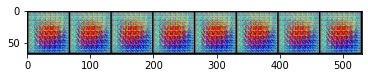


EPOCH COMPLETE
[1] discriminator loss: -0.863
[1] generator loss: -3.034
[1] classifier loss: 0.437
Classifier accuracy on GAN: 0.09099264705882353 Activation: 0.9799591898918152


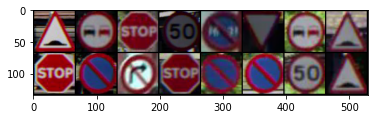

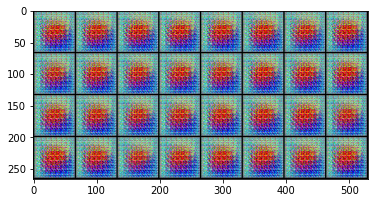

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                     ROC           PR IN  ... MEAN REAL MEAN FAKE        
                    mean     std    mean  ...       std      mean     std
Epoch:1, Batch:6  0.9892  0.0126  0.9944  ...    0.0039    0.5906  0.2201

[1 rows x 10 columns], [([{'ROC': 0.9859826743197279, 'PR IN': 0.9927808575724849, 'PR OUT': 0.9439429082637301, 'MEAN REAL': 0.9808026552200317, 'MEAN FAKE': 0.5651798844337463}, {'ROC': 0.9977678571428571, 'PR IN': 0.9988835131086679, 'PR OUT': 0.9867189985328155, 'MEAN REAL': 0.9861844778060913, 'MEAN FAKE': 0.42843982577323914}, {'ROC': 0.9942773658942744, 'PR IN': 0.9970878823807462, 'PR OUT': 0.9720959168805559, 'MEAN REAL': 0.9906376600265503, 'MEAN FAKE': 0.6226783394813538}, {'ROC': 0.9686149199263039, 'PR IN': 0.9837093145822811, 'PR OUT': 0.8944538079280876, 'MEAN REAL': 0.989815890789032, 'MEAN FAKE': 0.9455417394638062}, {'ROC': 0.9992194143282312, 'PR IN': 0.9995931237115144, 'PR OUT': 0.994916701130365, 'MEAN REAL': 0.9884442090988159, 'MEAN FAKE': 0

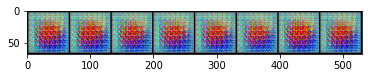

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:11  0.9358  0.1201  0.9635  ...    0.0025    0.7004  0.2048

[1 rows x 10 columns], [([{'ROC': 0.995593289399093, 'PR IN': 0.9977806229369538, 'PR OUT': 0.9780853386985573, 'MEAN REAL': 0.9884143471717834, 'MEAN FAKE': 0.5059289932250977}, {'ROC': 0.9806398145195578, 'PR IN': 0.9895706430948532, 'PR OUT': 0.9335570630720553, 'MEAN REAL': 0.9855465888977051, 'MEAN FAKE': 0.7839230298995972}, {'ROC': 0.9898053296839568, 'PR IN': 0.9946917109016138, 'PR OUT': 0.9560372550391294, 'MEAN REAL': 0.9844214916229248, 'MEAN FAKE': 0.5150763988494873}, {'ROC': 0.7212633751417233, 'PR IN': 0.8396747162712259, 'PR OUT': 0.5768080993016071, 'MEAN REAL': 0.9874067902565002, 'MEAN FAKE': 0.9980506896972656}, {'ROC': 0.9919455738024378, 'PR IN': 0.9958580612935247, 'PR OUT': 0.9629423125063472, 'MEAN REAL': 0.9907574653625488, 'MEAN FAKE'

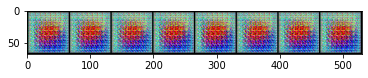

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:16  0.9749  0.0324  0.9871  ...    0.0021    0.6894  0.2123

[1 rows x 10 columns], [([{'ROC': 0.9910714285714286, 'PR IN': 0.9955265536355098, 'PR OUT': 0.9581548065643769, 'MEAN REAL': 0.989592969417572, 'MEAN FAKE': 0.6836696863174438}, {'ROC': 0.9962465454931972, 'PR IN': 0.9980751537677996, 'PR OUT': 0.981711054589951, 'MEAN REAL': 0.9867315888404846, 'MEAN FAKE': 0.478912353515625}, {'ROC': 0.918478621917517, 'PR IN': 0.9579050775826498, 'PR OUT': 0.7909581801406307, 'MEAN REAL': 0.984346330165863, 'MEAN FAKE': 0.9698607921600342}, {'ROC': 0.991643858064059, 'PR IN': 0.9957075657314168, 'PR OUT': 0.9623921907805646, 'MEAN REAL': 0.9851433038711548, 'MEAN FAKE': 0.4911313056945801}, {'ROC': 0.9772495261125284, 'PR IN': 0.9881564228655819, 'PR OUT': 0.9182192015089263, 'MEAN REAL': 0.9852115511894226, 'MEAN FAKE': 0.8

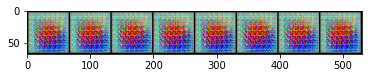

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:21  0.9566  0.0535  0.9772  ...    0.0021    0.7475  0.2557

[1 rows x 10 columns], [([{'ROC': 0.9983319825325965, 'PR IN': 0.9991054496903181, 'PR OUT': 0.9904510800058106, 'MEAN REAL': 0.9912835955619812, 'MEAN FAKE': 0.39332616329193115}, {'ROC': 0.9919649500425168, 'PR IN': 0.995932221666385, 'PR OUT': 0.9636839092081223, 'MEAN REAL': 0.9863875508308411, 'MEAN FAKE': 0.5899821519851685}, {'ROC': 0.8728132529053286, 'PR IN': 0.9328106596511493, 'PR OUT': 0.7247956679776633, 'MEAN REAL': 0.9862653017044067, 'MEAN FAKE': 0.9874894618988037}, {'ROC': 0.9334093989158163, 'PR IN': 0.9651436271325434, 'PR OUT': 0.8189006989704861, 'MEAN REAL': 0.9884828925132751, 'MEAN FAKE': 0.9747657775878906}, {'ROC': 0.9864908854166665, 'PR IN': 0.9931045027947728, 'PR OUT': 0.943778923105157, 'MEAN REAL': 0.9892794489860535, 'MEAN FAKE'

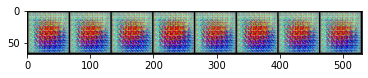

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE       
                     mean     std    mean  ...       std      mean    std
Epoch:1, Batch:26  0.9747  0.0246  0.9869  ...    0.0005    0.7686  0.169

[1 rows x 10 columns], [([{'ROC': 0.9881162751558958, 'PR IN': 0.9937949339601566, 'PR OUT': 0.9505867703412162, 'MEAN REAL': 0.98924720287323, 'MEAN FAKE': 0.7190596461296082}, {'ROC': 0.9741592926232994, 'PR IN': 0.986954202630458, 'PR OUT': 0.9058287252729644, 'MEAN REAL': 0.9882327914237976, 'MEAN FAKE': 0.8571695685386658}, {'ROC': 0.9327766262755102, 'PR IN': 0.9650498272588587, 'PR OUT': 0.817071541235479, 'MEAN REAL': 0.9883995056152344, 'MEAN FAKE': 0.9743743538856506}, {'ROC': 0.9833668819090137, 'PR IN': 0.9914069612471926, 'PR OUT': 0.9347081880439012, 'MEAN REAL': 0.9891754388809204, 'MEAN FAKE': 0.772183358669281}, {'ROC': 0.9951227235685941, 'PR IN': 0.9974990742286051, 'PR OUT': 0.9756911891541462, 'MEAN REAL': 0.9882059097290039, 'MEAN FAKE': 0.520

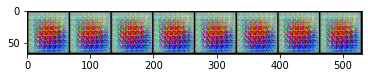

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE       
                     mean     std    mean  ...       std      mean    std
Epoch:1, Batch:31  0.9903  0.0045  0.9951  ...     0.002    0.6225  0.142

[1 rows x 10 columns], [([{'ROC': 0.9908217518778346, 'PR IN': 0.9953314558094372, 'PR OUT': 0.9583809358552124, 'MEAN REAL': 0.9917537569999695, 'MEAN FAKE': 0.7244395613670349}, {'ROC': 0.9892406506873582, 'PR IN': 0.9945142550328316, 'PR OUT': 0.9526354881772844, 'MEAN REAL': 0.9867730736732483, 'MEAN FAKE': 0.5460853576660156}, {'ROC': 0.9857496058319162, 'PR IN': 0.9928047317779115, 'PR OUT': 0.9399061883640443, 'MEAN REAL': 0.9884000420570374, 'MEAN FAKE': 0.743719220161438}, {'ROC': 0.9975397711167799, 'PR IN': 0.9986614843957691, 'PR OUT': 0.9914900764813122, 'MEAN REAL': 0.9893136024475098, 'MEAN FAKE': 0.40959304571151733}, {'ROC': 0.9881074174461452, 'PR IN': 0.9939427601042683, 'PR OUT': 0.9496985568328964, 'MEAN REAL': 0.9871847033500671, 'MEAN FAKE': 

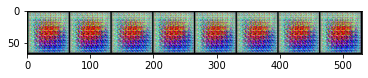

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:36  0.9887  0.0106  0.9942  ...    0.0018    0.6491  0.2163

[1 rows x 10 columns], [([{'ROC': 0.9955357142857142, 'PR IN': 0.9977588111901252, 'PR OUT': 0.976668962665719, 'MEAN REAL': 0.9866636395454407, 'MEAN FAKE': 0.4626465439796448}, {'ROC': 0.9737977873441044, 'PR IN': 0.9865211236238992, 'PR OUT': 0.9073581907035229, 'MEAN REAL': 0.9896508455276489, 'MEAN FAKE': 0.9143220782279968}, {'ROC': 0.9995377382723922, 'PR IN': 0.9996711452271075, 'PR OUT': 0.9993897167980765, 'MEAN REAL': 0.987246036529541, 'MEAN FAKE': 0.40180107951164246}, {'ROC': 0.9929631032100341, 'PR IN': 0.9963245579415196, 'PR OUT': 0.968149208692566, 'MEAN REAL': 0.991202175617218, 'MEAN FAKE': 0.6758162379264832}, {'ROC': 0.9816830866461168, 'PR IN': 0.9907455562323169, 'PR OUT': 0.9274913127049838, 'MEAN REAL': 0.9886643886566162, 'MEAN FAKE': 

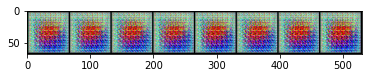

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:41  0.9522  0.0597  0.9751  ...    0.0031    0.7227  0.2999

[1 rows x 10 columns], [([{'ROC': 0.9999861598285148, 'PR IN': 0.9999864125708721, 'PR OUT': 0.9999860452101562, 'MEAN REAL': 0.9890070557594299, 'MEAN FAKE': 0.28943297266960144}, {'ROC': 0.9823582102111679, 'PR IN': 0.9910509099575981, 'PR OUT': 0.9302394622566867, 'MEAN REAL': 0.9897570013999939, 'MEAN FAKE': 0.8369570374488831}, {'ROC': 0.9245018645479025, 'PR IN': 0.9612104818782559, 'PR OUT': 0.8010416616372831, 'MEAN REAL': 0.981773316860199, 'MEAN FAKE': 0.9532407522201538}, {'ROC': 0.8599482599029196, 'PR IN': 0.9264218897471451, 'PR OUT': 0.7077660503400418, 'MEAN REAL': 0.987510621547699, 'MEAN FAKE': 0.9925878047943115}, {'ROC': 0.994313350340136, 'PR IN': 0.9970586268973745, 'PR OUT': 0.9748808264415759, 'MEAN REAL': 0.9870100617408752, 'MEAN FAKE':

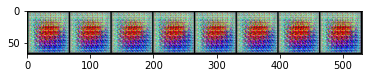

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC          PR IN  ... MEAN REAL MEAN FAKE        
                     mean    std    mean  ...       std      mean     std
Epoch:1, Batch:46  0.9918  0.009  0.9958  ...    0.0017    0.5662  0.2312

[1 rows x 10 columns], [([{'ROC': 0.9770684966695011, 'PR IN': 0.9882850301561088, 'PR OUT': 0.915467045342436, 'MEAN REAL': 0.9897488355636597, 'MEAN FAKE': 0.9107909798622131}, {'ROC': 0.9898684408659296, 'PR IN': 0.9944923934836447, 'PR OUT': 0.9630858236422257, 'MEAN REAL': 0.9851058125495911, 'MEAN FAKE': 0.6591084003448486}, {'ROC': 0.9992542915603742, 'PR IN': 0.9996263178376849, 'PR OUT': 0.9949524066349777, 'MEAN REAL': 0.9880660772323608, 'MEAN FAKE': 0.34491416811943054}, {'ROC': 0.9952423026502266, 'PR IN': 0.9975454917969484, 'PR OUT': 0.9765074915153096, 'MEAN REAL': 0.9866940975189209, 'MEAN FAKE': 0.5416117310523987}, {'ROC': 0.9977678571428571, 'PR IN': 0.9988835131086679, 'PR OUT': 0.9867189985328155, 'MEAN REAL': 0.9866495132446289, 'MEAN FAKE': 

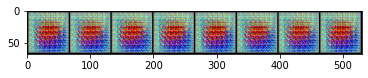

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:51  0.9622  0.0237  0.9806  ...     0.004    0.8536  0.1584

[1 rows x 10 columns], [([{'ROC': 0.9873810852465987, 'PR IN': 0.9934717196075924, 'PR OUT': 0.9468063290899065, 'MEAN REAL': 0.9826957583427429, 'MEAN FAKE': 0.5846038460731506}, {'ROC': 0.9732729680413832, 'PR IN': 0.9862493619030129, 'PR OUT': 0.9056713119349026, 'MEAN REAL': 0.9855221509933472, 'MEAN FAKE': 0.8436862826347351}, {'ROC': 0.9762164957128686, 'PR IN': 0.987819318963841, 'PR OUT': 0.912806810199023, 'MEAN REAL': 0.9901027679443359, 'MEAN FAKE': 0.9149490594863892}, {'ROC': 0.9332510673540249, 'PR IN': 0.96581206934227, 'PR OUT': 0.8160542395362507, 'MEAN REAL': 0.9819839000701904, 'MEAN FAKE': 0.9475474953651428}, {'ROC': 0.9407369393069728, 'PR IN': 0.9696108525686045, 'PR OUT': 0.8309395012953475, 'MEAN REAL': 0.990467369556427, 'MEAN FAKE': 0.

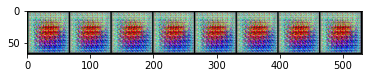

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:56  0.9869  0.0213  0.9934  ...    0.0018    0.6155  0.2042

[1 rows x 10 columns], [([{'ROC': 0.9962747794430272, 'PR IN': 0.9981335153799715, 'PR OUT': 0.9795286674575436, 'MEAN REAL': 0.990142285823822, 'MEAN FAKE': 0.5226477384567261}, {'ROC': 0.9491412450396826, 'PR IN': 0.9741440564262872, 'PR OUT': 0.8470409726870125, 'MEAN REAL': 0.9874657392501831, 'MEAN FAKE': 0.9678991436958313}, {'ROC': 0.9998361323696145, 'PR IN': 0.9998476766163146, 'PR OUT': 0.9998297331075944, 'MEAN REAL': 0.9912799596786499, 'MEAN FAKE': 0.4523847699165344}, {'ROC': 0.9924482488307824, 'PR IN': 0.9961678829318358, 'PR OUT': 0.9642067651852544, 'MEAN REAL': 0.9901708364486694, 'MEAN FAKE': 0.6043906807899475}, {'ROC': 0.9970099693523241, 'PR IN': 0.9984974463843129, 'PR OUT': 0.9830199843321162, 'MEAN REAL': 0.9871315956115723, 'MEAN FAKE'

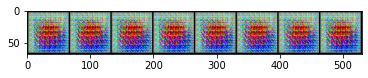

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:61  0.9835  0.0105  0.9916  ...    0.0021    0.7413  0.1181

[1 rows x 10 columns], [([{'ROC': 0.9880000177154195, 'PR IN': 0.9939167725936509, 'PR OUT': 0.9480331459168954, 'MEAN REAL': 0.987093448638916, 'MEAN FAKE': 0.7091099619865417}, {'ROC': 0.9781236713435375, 'PR IN': 0.9887908759094022, 'PR OUT': 0.9186414720316763, 'MEAN REAL': 0.9882156848907471, 'MEAN FAKE': 0.855217695236206}, {'ROC': 0.9676477687429138, 'PR IN': 0.9835959578078771, 'PR OUT': 0.8893598021599349, 'MEAN REAL': 0.9857102632522583, 'MEAN FAKE': 0.8653130531311035}, {'ROC': 0.9921470866992631, 'PR IN': 0.9959716445492337, 'PR OUT': 0.963581734301884, 'MEAN REAL': 0.9894746541976929, 'MEAN FAKE': 0.587316632270813}, {'ROC': 0.9918154761904763, 'PR IN': 0.9959001061196339, 'PR OUT': 0.9609658963288282, 'MEAN REAL': 0.991121768951416, 'MEAN FAKE': 0.

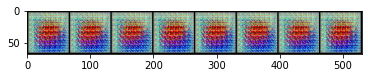

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                     ROC           PR IN  ... MEAN REAL MEAN FAKE        
                    mean     std    mean  ...       std      mean     std
Epoch:1, Batch:66  0.979  0.0286  0.9891  ...    0.0067    0.6771  0.2097

[1 rows x 10 columns], [([{'ROC': 0.9915801932752267, 'PR IN': 0.9956779700160807, 'PR OUT': 0.9623003877314903, 'MEAN REAL': 0.9909825921058655, 'MEAN FAKE': 0.7296046614646912}, {'ROC': 0.9792369747378118, 'PR IN': 0.9894851762313994, 'PR OUT': 0.9203726408127126, 'MEAN REAL': 0.9868897199630737, 'MEAN FAKE': 0.8473590016365051}, {'ROC': 0.9969856106505102, 'PR IN': 0.9984738539060984, 'PR OUT': 0.9829953551084954, 'MEAN REAL': 0.9912727475166321, 'MEAN FAKE': 0.43945130705833435}, {'ROC': 0.9296144238945578, 'PR IN': 0.9633021275643145, 'PR OUT': 0.8117146754259801, 'MEAN REAL': 0.9750508069992065, 'MEAN FAKE': 0.8938584327697754}, {'ROC': 0.9974827496102607, 'PR IN': 0.9986689042532465, 'PR OUT': 0.9863725394326697, 'MEAN REAL': 0.9886032342910767, 'MEAN FAKE':

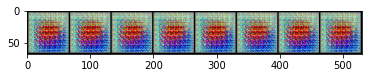

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC          PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std   mean  ...       std      mean     std
Epoch:1, Batch:71  0.9844  0.0122  0.992  ...     0.002    0.7312  0.2277

[1 rows x 10 columns], [([{'ROC': 0.9703715144912132, 'PR IN': 0.9849053348103485, 'PR OUT': 0.8967438315592955, 'MEAN REAL': 0.9880074262619019, 'MEAN FAKE': 0.9041134119033813}, {'ROC': 0.9800192212301585, 'PR IN': 0.9896446576913862, 'PR OUT': 0.9248539377820097, 'MEAN REAL': 0.9918734431266785, 'MEAN FAKE': 0.8970475196838379}, {'ROC': 0.9949638383999433, 'PR IN': 0.9973266387225365, 'PR OUT': 0.9783936470680521, 'MEAN REAL': 0.9879058599472046, 'MEAN FAKE': 0.5330422520637512}, {'ROC': 0.9992559523809523, 'PR IN': 0.9996279761904762, 'PR OUT': 0.9949540657814198, 'MEAN REAL': 0.991772472858429, 'MEAN FAKE': 0.43634480237960815}, {'ROC': 0.9776021736819728, 'PR IN': 0.9886175342003999, 'PR OUT': 0.916050957833512, 'MEAN REAL': 0.9891357421875, 'MEAN FAKE': 0.88

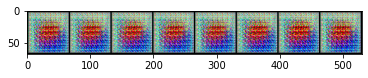

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:76  0.9834  0.0234  0.9915  ...    0.0033    0.5725  0.2214

[1 rows x 10 columns], [([{'ROC': 0.9911959901147959, 'PR IN': 0.9953800138655122, 'PR OUT': 0.9628350612557988, 'MEAN REAL': 0.9878484606742859, 'MEAN FAKE': 0.5986637473106384}, {'ROC': 0.9420667029832767, 'PR IN': 0.9702770981396894, 'PR OUT': 0.8331322114295093, 'MEAN REAL': 0.9793605208396912, 'MEAN FAKE': 0.904787540435791}, {'ROC': 0.9992559523809523, 'PR IN': 0.9996279761904762, 'PR OUT': 0.9949540657298489, 'MEAN REAL': 0.9864256978034973, 'MEAN FAKE': 0.30801650881767273}, {'ROC': 0.9941074085884355, 'PR IN': 0.9970251733190267, 'PR OUT': 0.9719343886623311, 'MEAN REAL': 0.9859350323677063, 'MEAN FAKE': 0.452538400888443}, {'ROC': 0.9902853068310657, 'PR IN': 0.9951126713523464, 'PR OUT': 0.9553621776007406, 'MEAN REAL': 0.9841448664665222, 'MEAN FAKE'

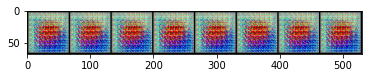

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:81  0.9797  0.0154  0.9896  ...    0.0047    0.7568  0.1508

[1 rows x 10 columns], [([{'ROC': 0.9963046742134354, 'PR IN': 0.9976809747895877, 'PR OUT': 0.9876396948618165, 'MEAN REAL': 0.9869906306266785, 'MEAN FAKE': 0.5102330446243286}, {'ROC': 0.9882297645620748, 'PR IN': 0.9940664040102167, 'PR OUT': 0.949383169103162, 'MEAN REAL': 0.9912946820259094, 'MEAN FAKE': 0.801110029220581}, {'ROC': 0.967743542729592, 'PR IN': 0.9836424314324564, 'PR OUT': 0.8895002902777337, 'MEAN REAL': 0.9797317981719971, 'MEAN FAKE': 0.835143506526947}, {'ROC': 0.9594112058886054, 'PR IN': 0.9790904875882511, 'PR OUT': 0.871157470352389, 'MEAN REAL': 0.9830184578895569, 'MEAN FAKE': 0.9034445881843567}, {'ROC': 0.986655860260771, 'PR IN': 0.9932948973860268, 'PR OUT': 0.943140567714911, 'MEAN REAL': 0.9893553853034973, 'MEAN FAKE': 0.73

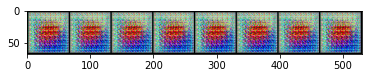


EPOCH COMPLETE
[2] discriminator loss: -1.768
[2] generator loss: -4.760
[2] classifier loss: 0.059
Classifier accuracy on GAN: 0.09099264705882353 Activation: 0.9921732544898987


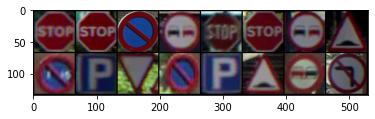

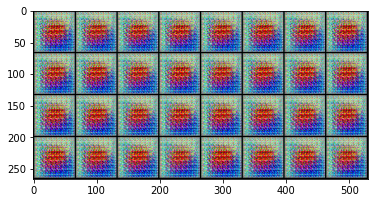

Training baseline
Init GAN
Epoch 1 Accuracy: 0.9776785714285714
Train GAN


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                    ROC           PR IN  ... MEAN REAL MEAN FAKE        
                   mean     std    mean  ...       std      mean     std
Epoch:0, Batch:6  0.989  0.0063  0.9943  ...    0.0022    0.6639  0.1823

[1 rows x 10 columns], [([{'ROC': 0.9849247316113946, 'PR IN': 0.9923472343778423, 'PR OUT': 0.9383377704318187, 'MEAN REAL': 0.9853341579437256, 'MEAN FAKE': 0.7161409854888916}, {'ROC': 0.9849856283659297, 'PR IN': 0.9922899359871492, 'PR OUT': 0.9396203307585376, 'MEAN REAL': 0.9860531091690063, 'MEAN FAKE': 0.7058303952217102}, {'ROC': 0.9877304111748866, 'PR IN': 0.9936665890731999, 'PR OUT': 0.9485906963197308, 'MEAN REAL': 0.9906803369522095, 'MEAN FAKE': 0.7960990071296692}, {'ROC': 0.999978409332483, 'PR IN': 0.9999790181799401, 'PR OUT': 0.9999781146697829, 'MEAN REAL': 0.9883579015731812, 'MEAN FAKE': 0.34409263730049133}, {'ROC': 0.9872842040462018, 'PR IN': 0.9933752213558732, 'PR OUT': 0.9475952613480898, 'MEAN REAL': 0.9893599152565002, 'MEAN FAKE': 0.7

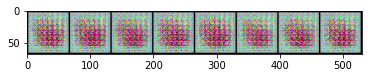

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                     ROC           PR IN  ... MEAN REAL MEAN FAKE        
                    mean     std    mean  ...       std      mean     std
Epoch:0, Batch:11  0.983  0.0143  0.9913  ...    0.0019    0.7163  0.2048

[1 rows x 10 columns], [([{'ROC': 0.9915846221301019, 'PR IN': 0.995684268292235, 'PR OUT': 0.9620959307986956, 'MEAN REAL': 0.9873147010803223, 'MEAN FAKE': 0.6183992624282837}, {'ROC': 0.9631170502054989, 'PR IN': 0.9811952190893182, 'PR OUT': 0.8788067643581763, 'MEAN REAL': 0.9883828163146973, 'MEAN FAKE': 0.9420744776725769}, {'ROC': 0.9957748724489797, 'PR IN': 0.9976408264202968, 'PR OUT': 0.9835263080294219, 'MEAN REAL': 0.9882285594940186, 'MEAN FAKE': 0.495219886302948}, {'ROC': 0.9727570064484127, 'PR IN': 0.9860715985635166, 'PR OUT': 0.9037219702623079, 'MEAN REAL': 0.9914993047714233, 'MEAN FAKE': 0.9271456599235535}, {'ROC': 0.9919195542800454, 'PR IN': 0.9957696747239831, 'PR OUT': 0.9653906838815918, 'MEAN REAL': 0.9866153597831726, 'MEAN FAKE': 0.

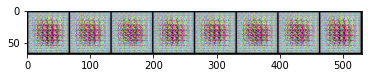

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE       
                     mean     std    mean  ...       std      mean    std
Epoch:0, Batch:16  0.9926  0.0075  0.9962  ...    0.0021    0.5632  0.213

[1 rows x 10 columns], [([{'ROC': 1.0, 'PR IN': 1.0, 'PR OUT': 1.0, 'MEAN REAL': 0.9909433722496033, 'MEAN FAKE': 0.38993358612060547}, {'ROC': 0.9888525722789115, 'PR IN': 0.9943977632488229, 'PR OUT': 0.9506198352641604, 'MEAN REAL': 0.9854673743247986, 'MEAN FAKE': 0.5906361937522888}, {'ROC': 0.9926414576247165, 'PR IN': 0.9962023781278572, 'PR OUT': 0.966643811805727, 'MEAN REAL': 0.9894436597824097, 'MEAN FAKE': 0.6365665197372437}, {'ROC': 0.9821251417233561, 'PR IN': 0.9907811159039241, 'PR OUT': 0.9316124703538377, 'MEAN REAL': 0.9892011284828186, 'MEAN FAKE': 0.8666206002235413}, {'ROC': 0.9994214808319161, 'PR IN': 0.999605778992749, 'PR OUT': 0.999182540406948, 'MEAN REAL': 0.987852931022644, 'MEAN FAKE': 0.33225923776626587}], 'Epoch:0, Batch:16')])


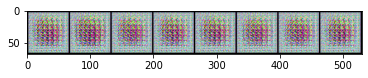

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:21  0.9771  0.0305  0.9883  ...    0.0021     0.695  0.2516

[1 rows x 10 columns], [([{'ROC': 0.9935842501062924, 'PR IN': 0.9966313399145145, 'PR OUT': 0.9710753096863525, 'MEAN REAL': 0.9900990724563599, 'MEAN FAKE': 0.5906767249107361}, {'ROC': 0.9992559523809523, 'PR IN': 0.9996279761904762, 'PR OUT': 0.9949540663397964, 'MEAN REAL': 0.9854565858840942, 'MEAN FAKE': 0.33765220642089844}, {'ROC': 0.9814148641227323, 'PR IN': 0.9905576367983546, 'PR OUT': 0.9270632958060653, 'MEAN REAL': 0.9882760047912598, 'MEAN FAKE': 0.8776759505271912}, {'ROC': 0.9872858648667799, 'PR IN': 0.9935959356237355, 'PR OUT': 0.9448605545400599, 'MEAN REAL': 0.9858585596084595, 'MEAN FAKE': 0.6889026165008545}, {'ROC': 0.9238649398561509, 'PR IN': 0.9609899168749731, 'PR OUT': 0.7991918101206914, 'MEAN REAL': 0.9892340302467346, 'MEAN FAK

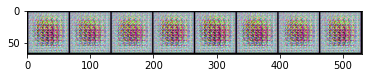

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:26  0.9785  0.0133  0.9889  ...    0.0048    0.7412  0.1535

[1 rows x 10 columns], [([{'ROC': 0.9586234233276644, 'PR IN': 0.9789070052592191, 'PR OUT': 0.867481958198326, 'MEAN REAL': 0.989443838596344, 'MEAN FAKE': 0.9588128328323364}, {'ROC': 0.9772163097009637, 'PR IN': 0.987980679791764, 'PR OUT': 0.9188308850791742, 'MEAN REAL': 0.9774631261825562, 'MEAN FAKE': 0.724723219871521}, {'ROC': 0.9905427340206917, 'PR IN': 0.995132890027344, 'PR OUT': 0.9580660658391179, 'MEAN REAL': 0.9886487722396851, 'MEAN FAKE': 0.6694296002388}, {'ROC': 0.991058695613662, 'PR IN': 0.995309341986801, 'PR OUT': 0.9605131849743286, 'MEAN REAL': 0.9859300255775452, 'MEAN FAKE': 0.5477845668792725}, {'ROC': 0.9752975083262472, 'PR IN': 0.987075425349468, 'PR OUT': 0.9131361920227299, 'MEAN REAL': 0.9835830330848694, 'MEAN FAKE': 0.805321

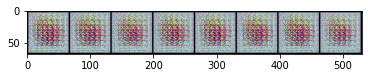

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE       
                     mean     std    mean  ...       std      mean    std
Epoch:0, Batch:31  0.9888  0.0077  0.9943  ...    0.0021    0.6248  0.163

[1 rows x 10 columns], [([{'ROC': 0.9944174284297054, 'PR IN': 0.9971219402144695, 'PR OUT': 0.9759222246355455, 'MEAN REAL': 0.9890970587730408, 'MEAN FAKE': 0.5266376733779907}, {'ROC': 0.9951880491780044, 'PR IN': 0.9975049950425585, 'PR OUT': 0.9774217253610203, 'MEAN REAL': 0.9838636517524719, 'MEAN FAKE': 0.4211871027946472}, {'ROC': 0.9920396869685373, 'PR IN': 0.9959520007085052, 'PR OUT': 0.9642724254287787, 'MEAN REAL': 0.9881255030632019, 'MEAN FAKE': 0.6096176505088806}, {'ROC': 0.976651630704365, 'PR IN': 0.988088837022814, 'PR OUT': 0.9138738606833321, 'MEAN REAL': 0.9859145879745483, 'MEAN FAKE': 0.8317304253578186}, {'ROC': 0.9857966624149661, 'PR IN': 0.9928093175205092, 'PR OUT': 0.9406974949378029, 'MEAN REAL': 0.9858883619308472, 'MEAN FAKE': 0.

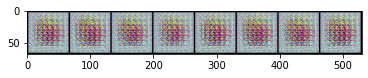

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:36  0.9834  0.0065  0.9915  ...    0.0021    0.7896  0.0722

[1 rows x 10 columns], [([{'ROC': 0.9894238945578233, 'PR IN': 0.9946328539869635, 'PR OUT': 0.9525461433149769, 'MEAN REAL': 0.9888203144073486, 'MEAN FAKE': 0.7644601464271545}, {'ROC': 0.9723307291666666, 'PR IN': 0.9860218310859932, 'PR OUT': 0.9005673103889607, 'MEAN REAL': 0.987307071685791, 'MEAN FAKE': 0.8545772433280945}, {'ROC': 0.9861725614725058, 'PR IN': 0.9927340376978019, 'PR OUT': 0.9445831858414862, 'MEAN REAL': 0.985327422618866, 'MEAN FAKE': 0.6810555458068848}, {'ROC': 0.983518570188492, 'PR IN': 0.9916842901705912, 'PR OUT': 0.9326645292216599, 'MEAN REAL': 0.9910310506820679, 'MEAN FAKE': 0.8542789220809937}, {'ROC': 0.9856128649376417, 'PR IN': 0.9925745793285734, 'PR OUT': 0.9410943564364728, 'MEAN REAL': 0.9881282448768616, 'MEAN FAKE': 

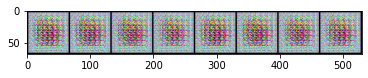

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE       
                     mean     std    mean  ...       std      mean    std
Epoch:0, Batch:41  0.9926  0.0051  0.9962  ...    0.0025    0.5776  0.136

[1 rows x 10 columns], [([{'ROC': 0.9903993498441042, 'PR IN': 0.9950880131211842, 'PR OUT': 0.9577852442293282, 'MEAN REAL': 0.9895911812782288, 'MEAN FAKE': 0.6862277388572693}, {'ROC': 0.9974523012329932, 'PR IN': 0.9986593628913785, 'PR OUT': 0.9863146144747005, 'MEAN REAL': 0.9868271350860596, 'MEAN FAKE': 0.4241996109485626}, {'ROC': 0.9937176693594103, 'PR IN': 0.9967836055937387, 'PR OUT': 0.970298167333218, 'MEAN REAL': 0.9905524849891663, 'MEAN FAKE': 0.5803614854812622}, {'ROC': 0.9963168535643423, 'PR IN': 0.9981463129070494, 'PR OUT': 0.9812749102995335, 'MEAN REAL': 0.9845969080924988, 'MEAN FAKE': 0.46114015579223633}, {'ROC': 0.9849452150651927, 'PR IN': 0.9923761433996614, 'PR OUT': 0.9373509432603581, 'MEAN REAL': 0.9858214855194092, 'MEAN FAKE': 

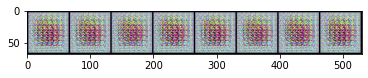

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC          PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std   mean  ...       std      mean     std
Epoch:0, Batch:46  0.9883  0.0108  0.994  ...     0.001    0.6714  0.1401

[1 rows x 10 columns], [([{'ROC': 0.9961778982426305, 'PR IN': 0.9979853552890421, 'PR OUT': 0.9815770897536578, 'MEAN REAL': 0.9872115254402161, 'MEAN FAKE': 0.5137026906013489}, {'ROC': 0.9923796015802153, 'PR IN': 0.9961264076357392, 'PR OUT': 0.963642494607935, 'MEAN REAL': 0.9877282977104187, 'MEAN FAKE': 0.6795135140419006}, {'ROC': 0.9947756120677438, 'PR IN': 0.9973763384837867, 'PR OUT': 0.9729690332486265, 'MEAN REAL': 0.9894214272499084, 'MEAN FAKE': 0.5968548059463501}, {'ROC': 0.9883665054563492, 'PR IN': 0.9940115248767978, 'PR OUT': 0.9506585354860033, 'MEAN REAL': 0.986823320388794, 'MEAN FAKE': 0.6766819953918457}, {'ROC': 0.9696136267006804, 'PR IN': 0.9846649238764529, 'PR OUT': 0.8937339838486481, 'MEAN REAL': 0.9872373342514038, 'MEAN FAKE': 0.

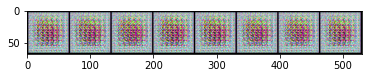

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:51  0.9667  0.0166  0.9829  ...    0.0051    0.8452  0.1275

[1 rows x 10 columns], [([{'ROC': 0.9565271909545068, 'PR IN': 0.9775210391775189, 'PR OUT': 0.865608410472277, 'MEAN REAL': 0.9802747368812561, 'MEAN FAKE': 0.8726258277893066}, {'ROC': 0.9684892511692177, 'PR IN': 0.9839467002536048, 'PR OUT': 0.8916758827294615, 'MEAN REAL': 0.9876759052276611, 'MEAN FAKE': 0.9198557734489441}, {'ROC': 0.9910714285714286, 'PR IN': 0.9955265536355098, 'PR OUT': 0.9581547487371997, 'MEAN REAL': 0.9898119568824768, 'MEAN FAKE': 0.6480069756507874}, {'ROC': 0.9703787113803855, 'PR IN': 0.9847758447636796, 'PR OUT': 0.8982748786846857, 'MEAN REAL': 0.9820178747177124, 'MEAN FAKE': 0.8052390217781067}, {'ROC': 0.9469860535359977, 'PR IN': 0.9725541968520769, 'PR OUT': 0.8448883730512342, 'MEAN REAL': 0.9920594692230225, 'MEAN FAKE'

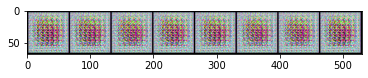

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:56  0.9806  0.0198  0.9901  ...    0.0015    0.7266  0.1871

[1 rows x 10 columns], [([{'ROC': 0.9961192159155328, 'PR IN': 0.9980058008004525, 'PR OUT': 0.9793785858317012, 'MEAN REAL': 0.9878831505775452, 'MEAN FAKE': 0.560839056968689}, {'ROC': 0.9723063704648526, 'PR IN': 0.986004709288435, 'PR OUT': 0.9005410071388389, 'MEAN REAL': 0.9862874746322632, 'MEAN FAKE': 0.8899619579315186}, {'ROC': 0.9496998343608276, 'PR IN': 0.9743984888550474, 'PR OUT': 0.8479632355840983, 'MEAN REAL': 0.9895530343055725, 'MEAN FAKE': 0.9651551246643066}, {'ROC': 0.9886255934665532, 'PR IN': 0.9940699863203915, 'PR OUT': 0.9535737342364834, 'MEAN REAL': 0.9857789278030396, 'MEAN FAKE': 0.6313214898109436}, {'ROC': 0.9962947092899659, 'PR IN': 0.9981418562220715, 'PR OUT': 0.9803713993003048, 'MEAN REAL': 0.9876906871795654, 'MEAN FAKE':

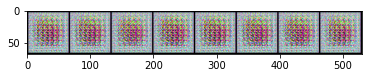

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:61  0.9566  0.0737  0.9773  ...     0.001    0.7025  0.2401

[1 rows x 10 columns], [([{'ROC': 0.9829334077380953, 'PR IN': 0.9914184956956285, 'PR OUT': 0.9310486535791022, 'MEAN REAL': 0.9883396029472351, 'MEAN FAKE': 0.8091291785240173}, {'ROC': 0.8252744782808957, 'PR IN': 0.9080726615850998, 'PR OUT': 0.6676707931863926, 'MEAN REAL': 0.9893117547035217, 'MEAN FAKE': 0.9959211349487305}, {'ROC': 0.9992559523809523, 'PR IN': 0.9996279761904762, 'PR OUT': 0.9949540649865446, 'MEAN REAL': 0.9882240295410156, 'MEAN FAKE': 0.3399317264556885}, {'ROC': 0.9879601580215419, 'PR IN': 0.9938325980822389, 'PR OUT': 0.9496910937500127, 'MEAN REAL': 0.987382709980011, 'MEAN FAKE': 0.7052372694015503}, {'ROC': 0.9876789257369615, 'PR IN': 0.9937227819304643, 'PR OUT': 0.9476005845839406, 'MEAN REAL': 0.9866107702255249, 'MEAN FAKE'

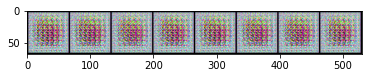

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:66  0.9915  0.0055  0.9956  ...    0.0022    0.6188  0.1641

[1 rows x 10 columns], [([{'ROC': 0.996161290036848, 'PR IN': 0.9980348735964408, 'PR OUT': 0.9795445640820941, 'MEAN REAL': 0.9858556389808655, 'MEAN FAKE': 0.420160710811615}, {'ROC': 0.9846767157383787, 'PR IN': 0.992178078345075, 'PR OUT': 0.9379607184939409, 'MEAN REAL': 0.9853383302688599, 'MEAN FAKE': 0.7224704623222351}, {'ROC': 0.9914871873228458, 'PR IN': 0.995555635139552, 'PR OUT': 0.9630459913306793, 'MEAN REAL': 0.987859308719635, 'MEAN FAKE': 0.6765443086624146}, {'ROC': 0.9976947810374148, 'PR IN': 0.9987697774940746, 'PR OUT': 0.9889793340354456, 'MEAN REAL': 0.9863669276237488, 'MEAN FAKE': 0.4737436771392822}, {'ROC': 0.9874336778982427, 'PR IN': 0.9935755521230926, 'PR OUT': 0.9472916440927196, 'MEAN REAL': 0.9908947944641113, 'MEAN FAKE': 0.

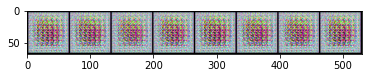

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:71  0.9832  0.0152  0.9914  ...    0.0021     0.686  0.2358

[1 rows x 10 columns], [([{'ROC': 0.9793604290674603, 'PR IN': 0.989586339419684, 'PR OUT': 0.9205418825330893, 'MEAN REAL': 0.9849185347557068, 'MEAN FAKE': 0.7613148093223572}, {'ROC': 0.9998505261479591, 'PR IN': 0.999866601144727, 'PR OUT': 0.999840704822869, 'MEAN REAL': 0.985114336013794, 'MEAN FAKE': 0.3120671510696411}, {'ROC': 0.9593846327593537, 'PR IN': 0.9793991465494483, 'PR OUT': 0.8692670684013654, 'MEAN REAL': 0.9898407459259033, 'MEAN FAKE': 0.9490943551063538}, {'ROC': 0.9886139677225056, 'PR IN': 0.994096986567544, 'PR OUT': 0.9521448750129226, 'MEAN REAL': 0.987001895904541, 'MEAN FAKE': 0.7635405659675598}, {'ROC': 0.9888431609623016, 'PR IN': 0.9942504441659902, 'PR OUT': 0.9517421310378413, 'MEAN REAL': 0.9880483746528625, 'MEAN FAKE': 0.6

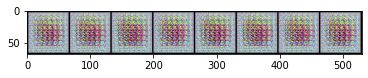

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:76  0.9778  0.0166  0.9887  ...    0.0015    0.7104  0.2339

[1 rows x 10 columns], [([{'ROC': 0.9760481992276078, 'PR IN': 0.9879021299913466, 'PR OUT': 0.9106744251668144, 'MEAN REAL': 0.984710693359375, 'MEAN FAKE': 0.7898257970809937}, {'ROC': 0.9926691379676871, 'PR IN': 0.9963031093013788, 'PR OUT': 0.9654294059612046, 'MEAN REAL': 0.9855020046234131, 'MEAN FAKE': 0.5255292057991028}, {'ROC': 0.9588703319869615, 'PR IN': 0.9791077715614371, 'PR OUT': 0.8685497074252847, 'MEAN REAL': 0.9847087860107422, 'MEAN FAKE': 0.9212497472763062}, {'ROC': 0.964707562712585, 'PR IN': 0.9820801835718255, 'PR OUT': 0.8816554437697577, 'MEAN REAL': 0.9872521162033081, 'MEAN FAKE': 0.9109272956848145}, {'ROC': 0.9965194736748867, 'PR IN': 0.9982039093101455, 'PR OUT': 0.9840231767854675, 'MEAN REAL': 0.9880516529083252, 'MEAN FAKE':

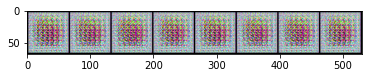

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:81  0.9884  0.0091  0.9941  ...    0.0007    0.6723  0.1633

[1 rows x 10 columns], [([{'ROC': 0.9957826229450113, 'PR IN': 0.9978398119903937, 'PR OUT': 0.9787255650429036, 'MEAN REAL': 0.9893113970756531, 'MEAN FAKE': 0.4983474612236023}, {'ROC': 0.9925617382369615, 'PR IN': 0.9962531133803056, 'PR OUT': 0.9646291784913499, 'MEAN REAL': 0.989651083946228, 'MEAN FAKE': 0.5811344981193542}, {'ROC': 0.9895944054705216, 'PR IN': 0.9947707733336332, 'PR OUT': 0.9532551410345445, 'MEAN REAL': 0.9888356924057007, 'MEAN FAKE': 0.6618736982345581}, {'ROC': 0.9914301658163266, 'PR IN': 0.9955965903964352, 'PR OUT': 0.9605211898960037, 'MEAN REAL': 0.9879820942878723, 'MEAN FAKE': 0.6874427199363708}, {'ROC': 0.972588709963152, 'PR IN': 0.9859880527986958, 'PR OUT': 0.9020226282858408, 'MEAN REAL': 0.9897691011428833, 'MEAN FAKE':

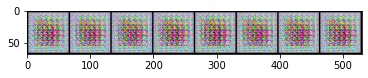


EPOCH COMPLETE
[1] discriminator loss: -0.895
[1] generator loss: -3.079
[1] classifier loss: 0.240
Classifier accuracy on GAN: 0.0895483193277311 Activation: 0.5114966630935669


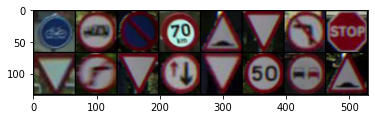

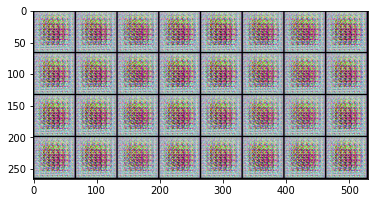

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                     ROC          PR IN  ... MEAN REAL MEAN FAKE        
                    mean     std   mean  ...       std      mean     std
Epoch:1, Batch:6  0.9922  0.0063  0.996  ...     0.003    0.6118  0.1219

[1 rows x 10 columns], [([{'ROC': 0.9985119047619047, 'PR IN': 0.9992558139277297, 'PR OUT': 0.9906510730860245, 'MEAN REAL': 0.9901065230369568, 'MEAN FAKE': 0.5134111046791077}, {'ROC': 0.9948071676587302, 'PR IN': 0.997393546866391, 'PR OUT': 0.9737207441930893, 'MEAN REAL': 0.9906197786331177, 'MEAN FAKE': 0.5886353254318237}, {'ROC': 0.9874320170776644, 'PR IN': 0.9935974562160192, 'PR OUT': 0.9464629141553605, 'MEAN REAL': 0.9893401265144348, 'MEAN FAKE': 0.7764354944229126}, {'ROC': 0.9962786546910432, 'PR IN': 0.9981373856979454, 'PR OUT': 0.9795329156977968, 'MEAN REAL': 0.9852151870727539, 'MEAN FAKE': 0.487332820892334}, {'ROC': 0.9837317088293651, 'PR IN': 0.9916718903708083, 'PR OUT': 0.9343768094965579, 'MEAN REAL': 0.9840044379234314, 'MEAN FAKE': 0.693

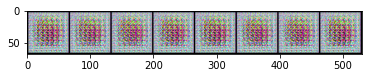

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:11  0.9415  0.0998  0.9688  ...    0.0021    0.7161  0.2001

[1 rows x 10 columns], [([{'ROC': 0.9962797619047619, 'PR IN': 0.9981384953886524, 'PR OUT': 0.9795335951596325, 'MEAN REAL': 0.984885573387146, 'MEAN FAKE': 0.4591919183731079}, {'ROC': 0.971218532986111, 'PR IN': 0.9854117805517341, 'PR OUT': 0.8988692598582927, 'MEAN REAL': 0.9816095232963562, 'MEAN FAKE': 0.8112649321556091}, {'ROC': 0.7636679997519842, 'PR IN': 0.8724222079351169, 'PR OUT': 0.6096303794596685, 'MEAN REAL': 0.9851458668708801, 'MEAN FAKE': 0.9953546524047852}, {'ROC': 0.9901646205357143, 'PR IN': 0.995014672447111, 'PR OUT': 0.9553190914722955, 'MEAN REAL': 0.9870015382766724, 'MEAN FAKE': 0.6652958989143372}, {'ROC': 0.9860369277919501, 'PR IN': 0.9929560119375199, 'PR OUT': 0.941587641931655, 'MEAN REAL': 0.9867146015167236, 'MEAN FAKE': 0

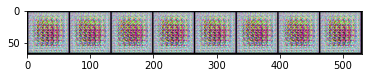

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC          PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std   mean  ...       std      mean     std
Epoch:1, Batch:16  0.9863  0.0199  0.993  ...    0.0014    0.6118  0.1998

[1 rows x 10 columns], [([{'ROC': 0.9963904832766439, 'PR IN': 0.9981650711061586, 'PR OUT': 0.9840062476804078, 'MEAN REAL': 0.9885822534561157, 'MEAN FAKE': 0.4841165244579315}, {'ROC': 0.9969966827876984, 'PR IN': 0.998484825729915, 'PR OUT': 0.9830064021053883, 'MEAN REAL': 0.9856152534484863, 'MEAN FAKE': 0.4726637005805969}, {'ROC': 0.9897322535785148, 'PR IN': 0.9947271112135799, 'PR OUT': 0.9546748356697522, 'MEAN REAL': 0.9882078766822815, 'MEAN FAKE': 0.6541435718536377}, {'ROC': 0.9511303544855443, 'PR IN': 0.9751104962276402, 'PR OUT': 0.8510972510404753, 'MEAN REAL': 0.9858455061912537, 'MEAN FAKE': 0.9443781971931458}, {'ROC': 0.9970022188562925, 'PR IN': 0.9983777120515641, 'PR OUT': 0.9856475029151618, 'MEAN REAL': 0.9878792762756348, 'MEAN FAKE': 0

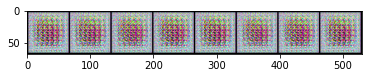

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:21  0.9853  0.0127  0.9925  ...    0.0018     0.683  0.1945

[1 rows x 10 columns], [([{'ROC': 0.9755438633786849, 'PR IN': 0.9876550887560129, 'PR OUT': 0.9097147440057414, 'MEAN REAL': 0.9868894219398499, 'MEAN FAKE': 0.8567848205566406}, {'ROC': 0.9934840472647392, 'PR IN': 0.9966977242318427, 'PR OUT': 0.9690189045841395, 'MEAN REAL': 0.989968478679657, 'MEAN FAKE': 0.55132657289505}, {'ROC': 0.9678548177083333, 'PR IN': 0.9834489000918224, 'PR OUT': 0.8908076346258587, 'MEAN REAL': 0.9886581897735596, 'MEAN FAKE': 0.923029899597168}, {'ROC': 0.9956658118976758, 'PR IN': 0.9978014247965267, 'PR OUT': 0.9782655646786215, 'MEAN REAL': 0.9851223230361938, 'MEAN FAKE': 0.4856073260307312}, {'ROC': 0.9938389092616213, 'PR IN': 0.9968366893646341, 'PR OUT': 0.9706991505715103, 'MEAN REAL': 0.9871717095375061, 'MEAN FAKE': 0

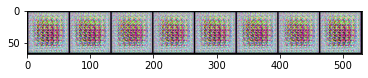

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:26  0.9921  0.0035  0.9959  ...    0.0045    0.6033  0.0702

[1 rows x 10 columns], [([{'ROC': 0.9918082793013039, 'PR IN': 0.9957718664355033, 'PR OUT': 0.9628214206191178, 'MEAN REAL': 0.9879110455513, 'MEAN FAKE': 0.629272997379303}, {'ROC': 0.9863591269841271, 'PR IN': 0.9930814425710661, 'PR OUT': 0.9427078137013366, 'MEAN REAL': 0.9788042902946472, 'MEAN FAKE': 0.4907265305519104}, {'ROC': 0.9954797999929138, 'PR IN': 0.997648929551542, 'PR OUT': 0.9793439824863228, 'MEAN REAL': 0.9882120490074158, 'MEAN FAKE': 0.5923647880554199}, {'ROC': 0.994109623015873, 'PR IN': 0.9970289162259725, 'PR OUT': 0.9713035343095385, 'MEAN REAL': 0.9904202222824097, 'MEAN FAKE': 0.6244312524795532}, {'ROC': 0.9927023543792517, 'PR IN': 0.9961380208221386, 'PR OUT': 0.9661362402164727, 'MEAN REAL': 0.9880155920982361, 'MEAN FAKE': 0.6

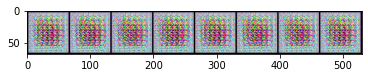

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC          PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std   mean  ...       std      mean     std
Epoch:1, Batch:31  0.9902  0.0106  0.995  ...    0.0036    0.6068  0.2585

[1 rows x 10 columns], [([{'ROC': 0.99196218200822, 'PR IN': 0.9959041436707298, 'PR OUT': 0.9641311919687787, 'MEAN REAL': 0.9902521967887878, 'MEAN FAKE': 0.7529223561286926}, {'ROC': 0.9985113511550454, 'PR IN': 0.9992548451672336, 'PR OUT': 0.9907740036553083, 'MEAN REAL': 0.9880632758140564, 'MEAN FAKE': 0.4088261127471924}, {'ROC': 1.0, 'PR IN': 1.0, 'PR OUT': 1.0, 'MEAN REAL': 0.9819860458374023, 'MEAN FAKE': 0.25398245453834534}, {'ROC': 0.9735807734552155, 'PR IN': 0.9863323047057138, 'PR OUT': 0.9061868892707272, 'MEAN REAL': 0.983832061290741, 'MEAN FAKE': 0.8220083117485046}, {'ROC': 0.9871934125212585, 'PR IN': 0.9935129108202523, 'PR OUT': 0.9449046569790567, 'MEAN REAL': 0.9893333911895752, 'MEAN FAKE': 0.7961385250091553}], 'Epoch:1, Batch:31')])


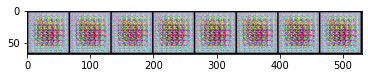

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC          PR IN  ... MEAN REAL MEAN FAKE        
                     mean    std    mean  ...       std      mean     std
Epoch:1, Batch:36  0.9904  0.003  0.9952  ...    0.0009    0.6119  0.0647

[1 rows x 10 columns], [([{'ROC': 0.9865800161210317, 'PR IN': 0.993238479682421, 'PR OUT': 0.9428006884921694, 'MEAN REAL': 0.9868972301483154, 'MEAN FAKE': 0.6967527270317078}, {'ROC': 0.9947817017431971, 'PR IN': 0.9973830381759713, 'PR OUT': 0.9729415330539001, 'MEAN REAL': 0.9860749840736389, 'MEAN FAKE': 0.5623757839202881}, {'ROC': 0.9904807300524378, 'PR IN': 0.9951941810429722, 'PR OUT': 0.9576024052724006, 'MEAN REAL': 0.9883415102958679, 'MEAN FAKE': 0.6370542049407959}, {'ROC': 0.9912054014314059, 'PR IN': 0.9955577469863639, 'PR OUT': 0.9604955697625875, 'MEAN REAL': 0.9865859746932983, 'MEAN FAKE': 0.5334709286689758}, {'ROC': 0.9891825219671202, 'PR IN': 0.994491485404693, 'PR OUT': 0.9535193070291254, 'MEAN REAL': 0.9878338575363159, 'MEAN FAKE': 0.

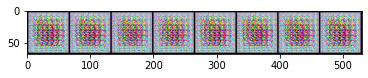

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:41  0.9879  0.0112  0.9939  ...    0.0057    0.6802  0.1769

[1 rows x 10 columns], [([{'ROC': 0.9918154761904762, 'PR IN': 0.9959001061196339, 'PR OUT': 0.9609666699257019, 'MEAN REAL': 0.9906412959098816, 'MEAN FAKE': 0.693588137626648}, {'ROC': 0.9886748644770409, 'PR IN': 0.9942645956042399, 'PR OUT': 0.949891462281991, 'MEAN REAL': 0.9908344745635986, 'MEAN FAKE': 0.7556552290916443}, {'ROC': 0.9923137223639455, 'PR IN': 0.9960423866916974, 'PR OUT': 0.964932756568714, 'MEAN REAL': 0.9868277907371521, 'MEAN FAKE': 0.6663519144058228}, {'ROC': 0.9980286059736394, 'PR IN': 0.9988850902210413, 'PR OUT': 0.9946885698532523, 'MEAN REAL': 0.9771415591239929, 'MEAN FAKE': 0.40160679817199707}, {'ROC': 0.9687156763747166, 'PR IN': 0.9842207748864094, 'PR OUT': 0.8910615348723161, 'MEAN REAL': 0.9838876724243164, 'MEAN FAKE':

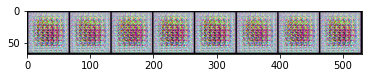

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:46  0.9812  0.0157  0.9904  ...    0.0049     0.695  0.1498

[1 rows x 10 columns], [([{'ROC': 0.9875859197845803, 'PR IN': 0.9937136768773966, 'PR OUT': 0.9472258014221497, 'MEAN REAL': 0.9866591095924377, 'MEAN FAKE': 0.7055606245994568}, {'ROC': 0.9560408473285147, 'PR IN': 0.9775584242920597, 'PR OUT': 0.8623871658044568, 'MEAN REAL': 0.986693263053894, 'MEAN FAKE': 0.9322468042373657}, {'ROC': 0.9762220317814625, 'PR IN': 0.9880327777296841, 'PR OUT': 0.9110891188661201, 'MEAN REAL': 0.9769141674041748, 'MEAN FAKE': 0.7005583643913269}, {'ROC': 0.9942690617913832, 'PR IN': 0.997020169673201, 'PR OUT': 0.9722722254723393, 'MEAN REAL': 0.9899673461914062, 'MEAN FAKE': 0.5446075201034546}, {'ROC': 0.9919040532879818, 'PR IN': 0.9959157136343468, 'PR OUT': 0.9624456739958351, 'MEAN REAL': 0.9859753847122192, 'MEAN FAKE':

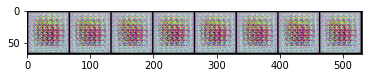

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:51  0.9952  0.0054  0.9975  ...    0.0027    0.4824  0.1514

[1 rows x 10 columns], [([{'ROC': 1.0, 'PR IN': 1.0, 'PR OUT': 1.0, 'MEAN REAL': 0.98740553855896, 'MEAN FAKE': 0.24753598868846893}, {'ROC': 0.9959409545068025, 'PR IN': 0.9978461287951922, 'PR OUT': 0.9791664857881566, 'MEAN REAL': 0.9826076030731201, 'MEAN FAKE': 0.4826507270336151}, {'ROC': 0.985880257050737, 'PR IN': 0.992908337518198, 'PR OUT': 0.94028907915832, 'MEAN REAL': 0.9841156005859375, 'MEAN FAKE': 0.6546753644943237}, {'ROC': 0.9969053376558956, 'PR IN': 0.9984086114740495, 'PR OUT': 0.9829059866713235, 'MEAN REAL': 0.9891495704650879, 'MEAN FAKE': 0.563215970993042}, {'ROC': 0.9970531506873583, 'PR IN': 0.9985185566207535, 'PR OUT': 0.9844090742623778, 'MEAN REAL': 0.9875165820121765, 'MEAN FAKE': 0.46368372440338135}], 'Epoch:1, Batch:51')])


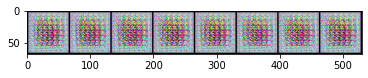

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                     ROC           PR IN  ... MEAN REAL MEAN FAKE        
                    mean     std    mean  ...       std      mean     std
Epoch:1, Batch:56  0.981  0.0193  0.9903  ...    0.0064    0.6544  0.2505

[1 rows x 10 columns], [([{'ROC': 0.9985921777565193, 'PR IN': 0.9992770269004534, 'PR OUT': 0.9933132025934419, 'MEAN REAL': 0.9860751628875732, 'MEAN FAKE': 0.41789939999580383}, {'ROC': 0.9515732399730725, 'PR IN': 0.9753568853983462, 'PR OUT': 0.8523430351941369, 'MEAN REAL': 0.9871848225593567, 'MEAN FAKE': 0.949045717716217}, {'ROC': 0.9757780390802154, 'PR IN': 0.9876933370448774, 'PR OUT': 0.9104874031371781, 'MEAN REAL': 0.98895663022995, 'MEAN FAKE': 0.8931518793106079}, {'ROC': 0.9977396231930272, 'PR IN': 0.9988557742340796, 'PR OUT': 0.9866906541629742, 'MEAN REAL': 0.9900361895561218, 'MEAN FAKE': 0.44619035720825195}, {'ROC': 0.981133631838152, 'PR IN': 0.9903294960051748, 'PR OUT': 0.9279843765367899, 'MEAN REAL': 0.9740889668464661, 'MEAN FAKE': 0.

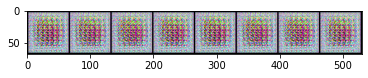

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                     ROC           PR IN  ... MEAN REAL MEAN FAKE        
                    mean     std    mean  ...       std      mean     std
Epoch:1, Batch:61  0.996  0.0036  0.9979  ...    0.0016    0.4762  0.1151

[1 rows x 10 columns], [([{'ROC': 0.9977678571428571, 'PR IN': 0.9988835131086679, 'PR OUT': 0.9867190199944895, 'MEAN REAL': 0.9906648397445679, 'MEAN FAKE': 0.5178245902061462}, {'ROC': 0.991140629428855, 'PR IN': 0.9955447009285605, 'PR OUT': 0.9593165915576811, 'MEAN REAL': 0.9884941577911377, 'MEAN FAKE': 0.6263036131858826}, {'ROC': 0.9994009973781179, 'PR IN': 0.9996681535351156, 'PR OUT': 0.9987868597970965, 'MEAN REAL': 0.9870903491973877, 'MEAN FAKE': 0.32386186718940735}, {'ROC': 0.9932371386054422, 'PR IN': 0.9963842552835607, 'PR OUT': 0.9697292934407495, 'MEAN REAL': 0.987368106842041, 'MEAN FAKE': 0.5055557489395142}, {'ROC': 0.9985119047619047, 'PR IN': 0.9992558139277297, 'PR OUT': 0.9906510735683309, 'MEAN REAL': 0.9900758266448975, 'MEAN FAKE': 0

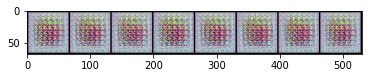

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                     ROC          PR IN  ... MEAN REAL MEAN FAKE        
                    mean    std    mean  ...       std      mean     std
Epoch:1, Batch:66  0.974  0.027  0.9867  ...    0.0018    0.7321  0.2436

[1 rows x 10 columns], [([{'ROC': 0.9992559523809523, 'PR IN': 0.9996279761904762, 'PR OUT': 0.9949540754569983, 'MEAN REAL': 0.9890910983085632, 'MEAN FAKE': 0.4506683349609375}, {'ROC': 0.9844680059523809, 'PR IN': 0.9921806884689975, 'PR OUT': 0.9361454705311385, 'MEAN REAL': 0.9866113662719727, 'MEAN FAKE': 0.7501627802848816}, {'ROC': 0.9959664204223357, 'PR IN': 0.9978914198511886, 'PR OUT': 0.982666513647515, 'MEAN REAL': 0.9868502020835876, 'MEAN FAKE': 0.5201110243797302}, {'ROC': 0.9443896373653629, 'PR IN': 0.9714666398362357, 'PR OUT': 0.838018928505639, 'MEAN REAL': 0.9892785549163818, 'MEAN FAKE': 0.9671888947486877}, {'ROC': 0.9457072216907596, 'PR IN': 0.9722211085916302, 'PR OUT': 0.8406506126036117, 'MEAN REAL': 0.9907817244529724, 'MEAN FAKE': 0.972

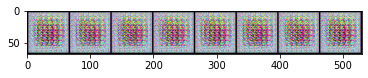

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:71  0.9916  0.0059  0.9957  ...    0.0013    0.6341  0.1456

[1 rows x 10 columns], [([{'ROC': 0.9971456030328798, 'PR IN': 0.9984530873301938, 'PR OUT': 0.9890121064631567, 'MEAN REAL': 0.9900382161140442, 'MEAN FAKE': 0.5659526586532593}, {'ROC': 0.9973891900510203, 'PR IN': 0.9986321903573451, 'PR OUT': 0.9861941319852143, 'MEAN REAL': 0.9873329401016235, 'MEAN FAKE': 0.4303819239139557}, {'ROC': 0.9862240469104309, 'PR IN': 0.9930233704281952, 'PR OUT': 0.9419369965197911, 'MEAN REAL': 0.9892776012420654, 'MEAN FAKE': 0.7865433692932129}, {'ROC': 0.9923973169997166, 'PR IN': 0.9961388040223098, 'PR OUT': 0.9636644446167467, 'MEAN REAL': 0.9882626533508301, 'MEAN FAKE': 0.6291229724884033}, {'ROC': 0.9847304156037414, 'PR IN': 0.9922751889819983, 'PR OUT': 0.9370047542368487, 'MEAN REAL': 0.9869942665100098, 'MEAN FAKE

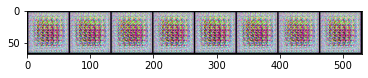

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:76  0.9868  0.0173  0.9932  ...    0.0011    0.5974  0.2741

[1 rows x 10 columns], [([{'ROC': 0.9992559523809523, 'PR IN': 0.9996279761904762, 'PR OUT': 0.9949541206640167, 'MEAN REAL': 0.9877654910087585, 'MEAN FAKE': 0.3240806460380554}, {'ROC': 1.0, 'PR IN': 1.0, 'PR OUT': 1.0, 'MEAN REAL': 0.9893271923065186, 'MEAN FAKE': 0.3236550986766815}, {'ROC': 0.9881865832270409, 'PR IN': 0.9938817192947411, 'PR OUT': 0.9493610481405494, 'MEAN REAL': 0.9878284335136414, 'MEAN FAKE': 0.697151243686676}, {'ROC': 0.9574619561366213, 'PR IN': 0.9782678678606763, 'PR OUT': 0.8660262891414805, 'MEAN REAL': 0.9903959035873413, 'MEAN FAKE': 0.9642423391342163}, {'ROC': 0.9891166427508502, 'PR IN': 0.994439487739143, 'PR OUT': 0.9521298076201261, 'MEAN REAL': 0.9893770217895508, 'MEAN FAKE': 0.6777247786521912}], 'Epoch:1, Batch:76')])

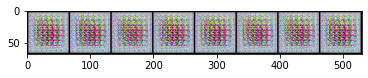

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:81  0.9635  0.0503  0.9811  ...    0.0027    0.7305  0.2489

[1 rows x 10 columns], [([{'ROC': 0.8761382157029479, 'PR IN': 0.9355214229670791, 'PR OUT': 0.7277508594377343, 'MEAN REAL': 0.9850309491157532, 'MEAN FAKE': 0.9846284985542297}, {'ROC': 0.9686115982851473, 'PR IN': 0.984004356939372, 'PR OUT': 0.8918531936216674, 'MEAN REAL': 0.9855379462242126, 'MEAN FAKE': 0.8970246315002441}, {'ROC': 0.999140802154195, 'PR IN': 0.9995279175094328, 'PR OUT': 0.9952006876154282, 'MEAN REAL': 0.9910980463027954, 'MEAN FAKE': 0.37769123911857605}, {'ROC': 0.9786972080498866, 'PR IN': 0.9892189389404882, 'PR OUT': 0.918641508764779, 'MEAN REAL': 0.986821711063385, 'MEAN FAKE': 0.8163807392120361}, {'ROC': 0.9947916666666667, 'PR IN': 0.997392922203383, 'PR OUT': 0.9729514462409885, 'MEAN REAL': 0.9898900985717773, 'MEAN FAKE': 0

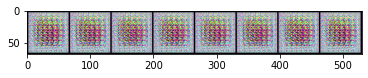


EPOCH COMPLETE
[2] discriminator loss: -1.793
[2] generator loss: -4.809
[2] classifier loss: 0.045
Classifier accuracy on GAN: 0.09099264705882353 Activation: 0.5358257293701172


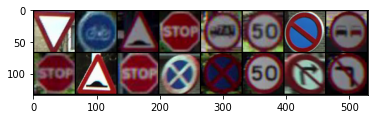

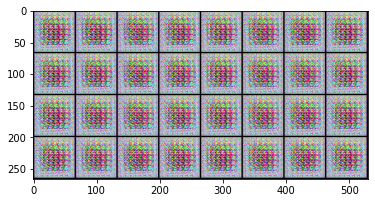

Training baseline
Init GAN
Epoch 1 Accuracy: 0.9784226190476191
Train GAN


/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                     ROC           PR IN  ... MEAN REAL MEAN FAKE        
                    mean     std    mean  ...       std      mean     std
Epoch:0, Batch:6  0.9808  0.0272  0.9899  ...    0.0034    0.6395  0.2552

[1 rows x 10 columns], [([{'ROC': 0.9870472603103742, 'PR IN': 0.993313811392785, 'PR OUT': 0.9460586602373677, 'MEAN REAL': 0.9900510907173157, 'MEAN FAKE': 0.7723983526229858}, {'ROC': 0.9997946118551587, 'PR IN': 0.999834815874497, 'PR OUT': 0.9997641495993363, 'MEAN REAL': 0.9893870949745178, 'MEAN FAKE': 0.28329798579216003}, {'ROC': 0.9877663956207483, 'PR IN': 0.9933884143458188, 'PR OUT': 0.9584345203711269, 'MEAN REAL': 0.9824802279472351, 'MEAN FAKE': 0.5919378399848938}, {'ROC': 0.9332433168579932, 'PR IN': 0.9649794764217366, 'PR OUT': 0.8190126147535536, 'MEAN REAL': 0.988030195236206, 'MEAN FAKE': 0.9711615443229675}, {'ROC': 0.9962686897675735, 'PR IN': 0.9981135689487878, 'PR OUT': 0.980470961090421, 'MEAN REAL': 0.9911559820175171, 'MEAN FAKE': 0.5

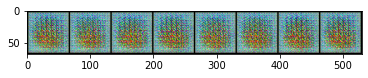

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:11  0.9894  0.0123  0.9945  ...    0.0016      0.64  0.2061

[1 rows x 10 columns], [([{'ROC': 0.9943150111607142, 'PR IN': 0.9969521642221376, 'PR OUT': 0.9743970891686071, 'MEAN REAL': 0.9886006116867065, 'MEAN FAKE': 0.6511731147766113}, {'ROC': 0.9679101783942744, 'PR IN': 0.9833220740329004, 'PR OUT': 0.8922522822735917, 'MEAN REAL': 0.9904255867004395, 'MEAN FAKE': 0.952948808670044}, {'ROC': 0.9967680431547619, 'PR IN': 0.998301531224687, 'PR OUT': 0.9827447768630212, 'MEAN REAL': 0.9911082983016968, 'MEAN FAKE': 0.5096585750579834}, {'ROC': 0.9971400669642857, 'PR IN': 0.9985409913708545, 'PR OUT': 0.9869032604488766, 'MEAN REAL': 0.98968106508255, 'MEAN FAKE': 0.4087791442871094}, {'ROC': 0.9910182823129251, 'PR IN': 0.9954600270150501, 'PR OUT': 0.9588123433143958, 'MEAN REAL': 0.9869272112846375, 'MEAN FAKE': 0

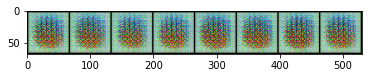

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:16  0.9938  0.0086  0.9968  ...    0.0027    0.5029  0.2648

[1 rows x 10 columns], [([{'ROC': 0.9999119765093537, 'PR IN': 0.9999212883756297, 'PR OUT': 0.9999064301430735, 'MEAN REAL': 0.9895799160003662, 'MEAN FAKE': 0.3031429052352905}, {'ROC': 0.9999750876913265, 'PR IN': 0.99997589478556, 'PR OUT': 0.999974689818707, 'MEAN REAL': 0.9854878187179565, 'MEAN FAKE': 0.3320307731628418}, {'ROC': 0.9892395434736395, 'PR IN': 0.9943874828054731, 'PR OUT': 0.9539931878520048, 'MEAN REAL': 0.9889293909072876, 'MEAN FAKE': 0.7012132406234741}, {'ROC': 0.98075053589144, 'PR IN': 0.9900633209196399, 'PR OUT': 0.9269357900897124, 'MEAN REAL': 0.9898532032966614, 'MEAN FAKE': 0.8693875074386597}, {'ROC': 0.9992559523809523, 'PR IN': 0.9996279761904762, 'PR OUT': 0.9949540649865446, 'MEAN REAL': 0.983896017074585, 'MEAN FAKE': 0.3

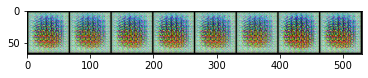

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC          PR IN  ... MEAN REAL MEAN FAKE        
                     mean    std    mean  ...       std      mean     std
Epoch:0, Batch:21  0.9763  0.018  0.9876  ...    0.0012    0.7855  0.1434

[1 rows x 10 columns], [([{'ROC': 0.9945320250496031, 'PR IN': 0.9971102447975244, 'PR OUT': 0.9746451093358051, 'MEAN REAL': 0.9874584078788757, 'MEAN FAKE': 0.5879355072975159}, {'ROC': 0.98658167694161, 'PR IN': 0.9932140025207281, 'PR OUT': 0.9431885331587524, 'MEAN REAL': 0.9873815178871155, 'MEAN FAKE': 0.6933771371841431}, {'ROC': 0.9826554970946713, 'PR IN': 0.9911673092083927, 'PR OUT': 0.9316388713284129, 'MEAN REAL': 0.9887381196022034, 'MEAN FAKE': 0.8342990279197693}, {'ROC': 0.9487664531958616, 'PR IN': 0.9727790025278746, 'PR OUT': 0.8520784781683393, 'MEAN REAL': 0.9863107204437256, 'MEAN FAKE': 0.9466010928153992}, {'ROC': 0.9689194036989796, 'PR IN': 0.9837801898786432, 'PR OUT': 0.8960066781454047, 'MEAN REAL': 0.9856058955192566, 'MEAN FAKE': 0.

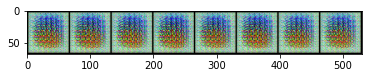

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:26  0.9932  0.0039  0.9964  ...    0.0035    0.5923  0.1115

[1 rows x 10 columns], [([{'ROC': 0.9943748007015305, 'PR IN': 0.9968849838353092, 'PR OUT': 0.9765052904322769, 'MEAN REAL': 0.9845130443572998, 'MEAN FAKE': 0.5515807867050171}, {'ROC': 0.9906573306405896, 'PR IN': 0.9951432178025771, 'PR OUT': 0.958979313439067, 'MEAN REAL': 0.9887460470199585, 'MEAN FAKE': 0.7361903786659241}, {'ROC': 0.9992238431831065, 'PR IN': 0.9995971733625642, 'PR OUT': 0.9949214008317808, 'MEAN REAL': 0.9930163025856018, 'MEAN FAKE': 0.4324073791503906}, {'ROC': 0.9925589702026645, 'PR IN': 0.9962721266055368, 'PR OUT': 0.963859926478716, 'MEAN REAL': 0.9901107549667358, 'MEAN FAKE': 0.630788266658783}, {'ROC': 0.9892949041595805, 'PR IN': 0.9942842499394741, 'PR OUT': 0.9572104911518347, 'MEAN REAL': 0.9854384064674377, 'MEAN FAKE': 

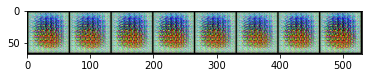

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:31  0.9844  0.0183  0.9919  ...    0.0021    0.6613  0.2778

[1 rows x 10 columns], [([{'ROC': 0.9980269451530612, 'PR IN': 0.9988875649941824, 'PR OUT': 0.991589143406161, 'MEAN REAL': 0.9867618083953857, 'MEAN FAKE': 0.4361172318458557}, {'ROC': 0.9772323642998867, 'PR IN': 0.9884799133288428, 'PR OUT': 0.9144001349970494, 'MEAN REAL': 0.9915617108345032, 'MEAN FAKE': 0.9215816259384155}, {'ROC': 0.9915768716340704, 'PR IN': 0.9957144192784587, 'PR OUT': 0.9607420686323429, 'MEAN REAL': 0.9893617630004883, 'MEAN FAKE': 0.6815143823623657}, {'ROC': 0.9556760204081632, 'PR IN': 0.9766552743887484, 'PR OUT': 0.8655694136484602, 'MEAN REAL': 0.987250566482544, 'MEAN FAKE': 0.9405071139335632}, {'ROC': 0.9992559523809522, 'PR IN': 0.9996279761904762, 'PR OUT': 0.9949540672811876, 'MEAN REAL': 0.9904714226722717, 'MEAN FAKE':

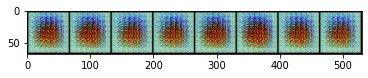

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC         PR IN  ... MEAN REAL MEAN FAKE        
                     mean    std   mean  ...       std      mean     std
Epoch:0, Batch:36  0.9782  0.023  0.988  ...    0.0014    0.6743  0.2898

[1 rows x 10 columns], [([{'ROC': 0.9989082872732427, 'PR IN': 0.999218394240553, 'PR OUT': 0.9985437802724011, 'MEAN REAL': 0.986916720867157, 'MEAN FAKE': 0.32046157121658325}, {'ROC': 0.966338488520408, 'PR IN': 0.9823224596465351, 'PR OUT': 0.8898246184153458, 'MEAN REAL': 0.9845306873321533, 'MEAN FAKE': 0.8842407464981079}, {'ROC': 0.9828337585034014, 'PR IN': 0.9911404172098667, 'PR OUT': 0.9342829432524891, 'MEAN REAL': 0.9872883558273315, 'MEAN FAKE': 0.8081546425819397}, {'ROC': 0.9447478210034014, 'PR IN': 0.9681511528110103, 'PR OUT': 0.8552803611711308, 'MEAN REAL': 0.9859126806259155, 'MEAN FAKE': 0.9521376490592957}, {'ROC': 0.9983358577806123, 'PR IN': 0.9991111751493124, 'PR OUT': 0.991074608778425, 'MEAN REAL': 0.9881721138954163, 'MEAN FAKE': 0.4066

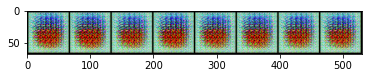

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE       
                     mean     std    mean  ...       std      mean    std
Epoch:0, Batch:41  0.9966  0.0028  0.9982  ...    0.0018    0.4779  0.072

[1 rows x 10 columns], [([{'ROC': 0.9964790603741496, 'PR IN': 0.9981629550663472, 'PR OUT': 0.9840864248369467, 'MEAN REAL': 0.9887279272079468, 'MEAN FAKE': 0.4487411081790924}, {'ROC': 0.9983762710813492, 'PR IN': 0.9991271922189816, 'PR OUT': 0.9905121385749018, 'MEAN REAL': 0.984825611114502, 'MEAN FAKE': 0.4043550193309784}, {'ROC': 0.9982489415036847, 'PR IN': 0.9989206621423558, 'PR OUT': 0.9933246876147179, 'MEAN REAL': 0.9889234900474548, 'MEAN FAKE': 0.496432363986969}, {'ROC': 0.9918326380031178, 'PR IN': 0.9958402264900952, 'PR OUT': 0.963100833490453, 'MEAN REAL': 0.9888648986816406, 'MEAN FAKE': 0.5928232073783875}, {'ROC': 0.9980928243693311, 'PR IN': 0.9989142640276464, 'PR OUT': 0.9952816157521105, 'MEAN REAL': 0.9886961579322815, 'MEAN FAKE': 0.4

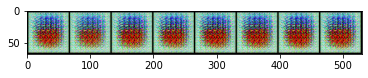

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                     ROC          PR IN  ... MEAN REAL MEAN FAKE       
                    mean    std    mean  ...       std      mean    std
Epoch:0, Batch:46  0.981  0.006  0.9902  ...     0.002    0.7985  0.099

[1 rows x 10 columns], [([{'ROC': 0.9846169261975625, 'PR IN': 0.9921139594766918, 'PR OUT': 0.9381000109090665, 'MEAN REAL': 0.9885518550872803, 'MEAN FAKE': 0.8066241145133972}, {'ROC': 0.9805822394061792, 'PR IN': 0.9899450826023981, 'PR OUT': 0.9281932375650723, 'MEAN REAL': 0.9887927770614624, 'MEAN FAKE': 0.8318824172019958}, {'ROC': 0.9709223533163267, 'PR IN': 0.9849122984447106, 'PR OUT': 0.9019805692949523, 'MEAN REAL': 0.9900687336921692, 'MEAN FAKE': 0.9296389222145081}, {'ROC': 0.982523185055272, 'PR IN': 0.9911287260533738, 'PR OUT': 0.9313518271230696, 'MEAN REAL': 0.9864045977592468, 'MEAN FAKE': 0.7669625282287598}, {'ROC': 0.9862915869472789, 'PR IN': 0.9928867929644046, 'PR OUT': 0.9463905416364433, 'MEAN REAL': 0.985234260559082, 'MEAN FAKE': 0.657541

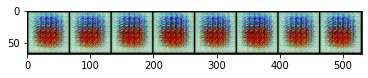

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:51  0.9854  0.0149  0.9924  ...     0.003    0.6513  0.2692

[1 rows x 10 columns], [([{'ROC': 0.9726983241213153, 'PR IN': 0.986055412955156, 'PR OUT': 0.9030157530727383, 'MEAN REAL': 0.9909837245941162, 'MEAN FAKE': 0.9319539666175842}, {'ROC': 0.9663634008290817, 'PR IN': 0.9829079655775054, 'PR OUT': 0.8864987856725304, 'MEAN REAL': 0.986151933670044, 'MEAN FAKE': 0.9013650417327881}, {'ROC': 1.0, 'PR IN': 1.0, 'PR OUT': 1.0, 'MEAN REAL': 0.9886219501495361, 'MEAN FAKE': 0.28370147943496704}, {'ROC': 0.9912502435870182, 'PR IN': 0.9951505811521785, 'PR OUT': 0.9725348929058858, 'MEAN REAL': 0.9850195050239563, 'MEAN FAKE': 0.5631253719329834}, {'ROC': 0.9964480583900227, 'PR IN': 0.9980506341302443, 'PR OUT': 0.9862914373552525, 'MEAN REAL': 0.9918453097343445, 'MEAN FAKE': 0.5762052536010742}], 'Epoch:0, Batch:51')]

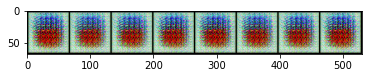

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC          PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std   mean  ...       std      mean     std
Epoch:0, Batch:56  0.9845  0.0128  0.992  ...    0.0035    0.7021  0.1864

[1 rows x 10 columns], [([{'ROC': 0.989087855194161, 'PR IN': 0.994146375251217, 'PR OUT': 0.9549963018045515, 'MEAN REAL': 0.9886800646781921, 'MEAN FAKE': 0.7693138122558594}, {'ROC': 0.9941577868126417, 'PR IN': 0.9969038836547269, 'PR OUT': 0.9740183593604776, 'MEAN REAL': 0.9839624762535095, 'MEAN FAKE': 0.5385805368423462}, {'ROC': 0.9943366018282312, 'PR IN': 0.9970033012855399, 'PR OUT': 0.9754056007798394, 'MEAN REAL': 0.9840885400772095, 'MEAN FAKE': 0.47009673714637756}, {'ROC': 0.9636357798327663, 'PR IN': 0.9813331042172337, 'PR OUT': 0.8810407590566524, 'MEAN REAL': 0.9829462170600891, 'MEAN FAKE': 0.8705472946166992}, {'ROC': 0.981429257901077, 'PR IN': 0.9905985277009902, 'PR OUT': 0.9272056382642759, 'MEAN REAL': 0.9908972382545471, 'MEAN FAKE': 0.

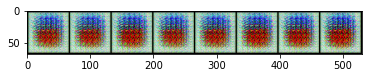

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:61  0.9853  0.0074  0.9925  ...    0.0019    0.7547  0.1342

[1 rows x 10 columns], [([{'ROC': 0.9880952380952381, 'PR IN': 0.9938443137046453, 'PR OUT': 0.950398475293023, 'MEAN REAL': 0.9882934093475342, 'MEAN FAKE': 0.7470807433128357}, {'ROC': 0.9752809001204649, 'PR IN': 0.9873595147592118, 'PR OUT': 0.9108291445541578, 'MEAN REAL': 0.9872636795043945, 'MEAN FAKE': 0.8662025332450867}, {'ROC': 0.9933019106079931, 'PR IN': 0.9964310002480669, 'PR OUT': 0.9712196649441223, 'MEAN REAL': 0.9854614734649658, 'MEAN FAKE': 0.5394958257675171}, {'ROC': 0.9802467536493765, 'PR IN': 0.9898583927678712, 'PR OUT': 0.9254621925066957, 'MEAN REAL': 0.9900405406951904, 'MEAN FAKE': 0.8697537183761597}, {'ROC': 0.9895932982568029, 'PR IN': 0.9947790398842943, 'PR OUT': 0.9529977487614993, 'MEAN REAL': 0.9897701740264893, 'MEAN FAKE'

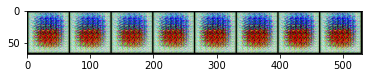

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:66  0.9931  0.0031  0.9963  ...    0.0031    0.5625  0.1068

[1 rows x 10 columns], [([{'ROC': 0.9970603475765305, 'PR IN': 0.9984744427827115, 'PR OUT': 0.9852353256123025, 'MEAN REAL': 0.9880356788635254, 'MEAN FAKE': 0.4403216242790222}, {'ROC': 0.9954659598214286, 'PR IN': 0.9975181036413499, 'PR OUT': 0.9785547715505291, 'MEAN REAL': 0.9846449494361877, 'MEAN FAKE': 0.47731998562812805}, {'ROC': 0.9913006218112245, 'PR IN': 0.9954686082805821, 'PR OUT': 0.9621090971256517, 'MEAN REAL': 0.9823716878890991, 'MEAN FAKE': 0.5650827884674072}, {'ROC': 0.9916975579294218, 'PR IN': 0.9955433316545456, 'PR OUT': 0.9657292191597011, 'MEAN REAL': 0.9892781972885132, 'MEAN FAKE': 0.6304101347923279}, {'ROC': 0.9897815245890023, 'PR IN': 0.9946772698678057, 'PR OUT': 0.9576876728309195, 'MEAN REAL': 0.9895542860031128, 'MEAN FAK

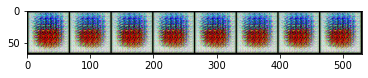

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:71  0.9884  0.0078  0.9939  ...    0.0019    0.6315  0.1828

[1 rows x 10 columns], [([{'ROC': 0.9789651537698413, 'PR IN': 0.989280303524063, 'PR OUT': 0.9199592053932322, 'MEAN REAL': 0.98907071352005, 'MEAN FAKE': 0.8291831612586975}, {'ROC': 0.9831210804634354, 'PR IN': 0.9911370775186026, 'PR OUT': 0.9359698850394295, 'MEAN REAL': 0.9853317141532898, 'MEAN FAKE': 0.694826602935791}, {'ROC': 0.9913820020195578, 'PR IN': 0.9954718492703217, 'PR OUT': 0.9663043170939496, 'MEAN REAL': 0.9882364869117737, 'MEAN FAKE': 0.6048864126205444}, {'ROC': 0.9990704940830498, 'PR IN': 0.999479432714683, 'PR OUT': 0.9947414039954607, 'MEAN REAL': 0.9903944134712219, 'MEAN FAKE': 0.33767402172088623}, {'ROC': 0.9894875593466554, 'PR IN': 0.9942682722434649, 'PR OUT': 0.9632935917694041, 'MEAN REAL': 0.989549994468689, 'MEAN FAKE': 0.

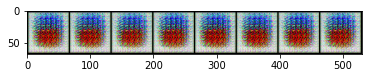

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:76  0.9822  0.0081  0.9909  ...    0.0019    0.7769  0.1186

[1 rows x 10 columns], [([{'ROC': 0.9743823961876419, 'PR IN': 0.9869510641059054, 'PR OUT': 0.90747763547005, 'MEAN REAL': 0.9890449047088623, 'MEAN FAKE': 0.9038165211677551}, {'ROC': 0.9868540515164399, 'PR IN': 0.9932463776490891, 'PR OUT': 0.9445964009049979, 'MEAN REAL': 0.9905328750610352, 'MEAN FAKE': 0.8101121187210083}, {'ROC': 0.9912436003047052, 'PR IN': 0.9954857244548591, 'PR OUT': 0.9603361075384921, 'MEAN REAL': 0.9873292446136475, 'MEAN FAKE': 0.6452388167381287}, {'ROC': 0.9857534810799321, 'PR IN': 0.992732813647535, 'PR OUT': 0.9421605010556774, 'MEAN REAL': 0.9858953356742859, 'MEAN FAKE': 0.6594288349151611}, {'ROC': 0.9728035094246033, 'PR IN': 0.9860092437020199, 'PR OUT': 0.9037862133572997, 'MEAN REAL': 0.986293613910675, 'MEAN FAKE': 0

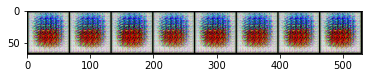

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:0, Batch:81  0.9896  0.0056  0.9945  ...    0.0015     0.667  0.1723

[1 rows x 10 columns], [([{'ROC': 0.9968942655187075, 'PR IN': 0.9983880704400725, 'PR OUT': 0.9829021067080808, 'MEAN REAL': 0.9865670204162598, 'MEAN FAKE': 0.43114173412323}, {'ROC': 0.983092292906746, 'PR IN': 0.9911763821967235, 'PR OUT': 0.9373001842307777, 'MEAN REAL': 0.989841639995575, 'MEAN FAKE': 0.834903359413147}, {'ROC': 0.9880670041454083, 'PR IN': 0.9939959747168235, 'PR OUT': 0.9476388826656235, 'MEAN REAL': 0.9900071620941162, 'MEAN FAKE': 0.7737294435501099}, {'ROC': 0.9864000938917233, 'PR IN': 0.9924772893543652, 'PR OUT': 0.9513244666926921, 'MEAN REAL': 0.9881761074066162, 'MEAN FAKE': 0.7543339133262634}, {'ROC': 0.9936407180059524, 'PR IN': 0.9965928502344243, 'PR OUT': 0.9764607778649966, 'MEAN REAL': 0.987170934677124, 'MEAN FAKE': 0.5

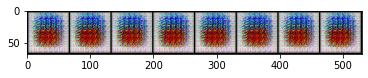


EPOCH COMPLETE
[1] discriminator loss: -0.854
[1] generator loss: -3.030
[1] classifier loss: 0.463
Classifier accuracy on GAN: 0.05501575630252101 Activation: 0.8046384453773499


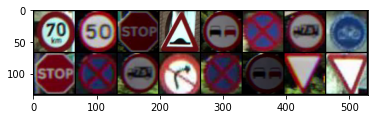

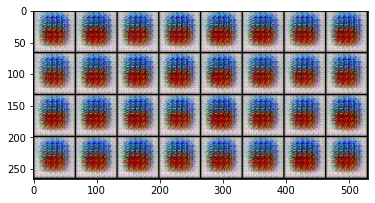

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                    ROC           PR IN  ... MEAN REAL MEAN FAKE        
                   mean     std    mean  ...       std      mean     std
Epoch:1, Batch:6  0.995  0.0059  0.9973  ...    0.0034    0.5298  0.1406

[1 rows x 10 columns], [([{'ROC': 0.9849158739016439, 'PR IN': 0.9921623202490709, 'PR OUT': 0.9395637203469174, 'MEAN REAL': 0.9867232441902161, 'MEAN FAKE': 0.7556997537612915}, {'ROC': 0.9986381271258502, 'PR IN': 0.99924799054649, 'PR OUT': 0.9938849025508923, 'MEAN REAL': 0.9879937767982483, 'MEAN FAKE': 0.4800686836242676}, {'ROC': 0.9949533198696144, 'PR IN': 0.9973342856914325, 'PR OUT': 0.9776149258136213, 'MEAN REAL': 0.9815952181816101, 'MEAN FAKE': 0.5246070623397827}, {'ROC': 0.9976737439767573, 'PR IN': 0.9985373988861045, 'PR OUT': 0.9926196192408268, 'MEAN REAL': 0.9899303913116455, 'MEAN FAKE': 0.5179741382598877}, {'ROC': 0.9988667667587867, 'PR IN': 0.9993723234650654, 'PR OUT': 0.9944053078885742, 'MEAN REAL': 0.9896659851074219, 'MEAN FAKE': 0.370

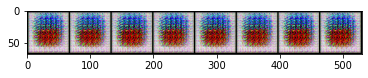

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:11  0.9977  0.0022  0.9988  ...    0.0021    0.4118  0.0928

[1 rows x 10 columns], [([{'ROC': 0.9942081650368481, 'PR IN': 0.9970581859922881, 'PR OUT': 0.9738089877963382, 'MEAN REAL': 0.9894197583198547, 'MEAN FAKE': 0.5522803664207458}, {'ROC': 0.9972934160643422, 'PR IN': 0.9984975207302611, 'PR OUT': 0.9874198356334791, 'MEAN REAL': 0.988530158996582, 'MEAN FAKE': 0.45226016640663147}, {'ROC': 0.9987831721230158, 'PR IN': 0.9993387560417886, 'PR OUT': 0.9942067090809278, 'MEAN REAL': 0.9869250655174255, 'MEAN FAKE': 0.3772568702697754}, {'ROC': 0.9984493471867913, 'PR IN': 0.9991957912778973, 'PR OUT': 0.9905873954733875, 'MEAN REAL': 0.9872167706489563, 'MEAN FAKE': 0.3624178469181061}, {'ROC': 1.0, 'PR IN': 1.0, 'PR OUT': 1.0, 'MEAN REAL': 0.9838013648986816, 'MEAN FAKE': 0.31470271944999695}], 'Epoch:1, Batch:11'

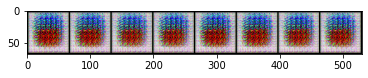

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:16  0.9876  0.0109  0.9936  ...    0.0021    0.6371  0.2468

[1 rows x 10 columns], [([{'ROC': 0.9996213329081632, 'PR IN': 0.9997435482360679, 'PR OUT': 0.9994817328634583, 'MEAN REAL': 0.9836676716804504, 'MEAN FAKE': 0.39337158203125}, {'ROC': 0.9834814785289117, 'PR IN': 0.9916403224261294, 'PR OUT': 0.9327611981916849, 'MEAN REAL': 0.9868358373641968, 'MEAN FAKE': 0.7706024646759033}, {'ROC': 0.9750240265376985, 'PR IN': 0.9872772221278762, 'PR OUT': 0.9090255874588, 'MEAN REAL': 0.9871761202812195, 'MEAN FAKE': 0.8377473950386047}, {'ROC': 0.9985860880810659, 'PR IN': 0.9992514799940633, 'PR OUT': 0.9935041093212582, 'MEAN REAL': 0.9890168905258179, 'MEAN FAKE': 0.34467238187789917}, {'ROC': 0.9813489849064627, 'PR IN': 0.9903046538388814, 'PR OUT': 0.9300523997660916, 'MEAN REAL': 0.9885430932044983, 'MEAN FAKE': 0

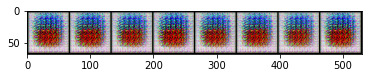

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC         PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std  mean  ...       std      mean     std
Epoch:1, Batch:21  0.9806  0.0247  0.99  ...    0.0037    0.6491  0.2496

[1 rows x 10 columns], [([{'ROC': 0.9914816512542517, 'PR IN': 0.995380499316033, 'PR OUT': 0.9649055406431467, 'MEAN REAL': 0.9804227948188782, 'MEAN FAKE': 0.4813138544559479}, {'ROC': 0.9836193266369049, 'PR IN': 0.9916152946058944, 'PR OUT': 0.9348205530638625, 'MEAN REAL': 0.9883974194526672, 'MEAN FAKE': 0.8039681911468506}, {'ROC': 0.9918381740717122, 'PR IN': 0.995870963574731, 'PR OUT': 0.9621561616960173, 'MEAN REAL': 0.9880681037902832, 'MEAN FAKE': 0.6430124044418335}, {'ROC': 0.9374180661848073, 'PR IN': 0.9676342513322931, 'PR OUT': 0.8252382528599568, 'MEAN REAL': 0.988466739654541, 'MEAN FAKE': 0.9724230170249939}, {'ROC': 0.9985135655824829, 'PR IN': 0.9992562295969059, 'PR OUT': 0.9910106950394824, 'MEAN REAL': 0.9894242286682129, 'MEAN FAKE': 0.3449

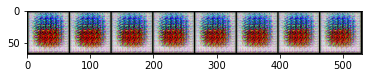

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC          PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std   mean  ...       std      mean     std
Epoch:1, Batch:26  0.9846  0.0128  0.992  ...    0.0039    0.6891  0.1029

[1 rows x 10 columns], [([{'ROC': 0.9919350552721088, 'PR IN': 0.9956996010818532, 'PR OUT': 0.9659461458423808, 'MEAN REAL': 0.9889035820960999, 'MEAN FAKE': 0.6740947961807251}, {'ROC': 0.9627771355938209, 'PR IN': 0.9804794979905909, 'PR OUT': 0.8826083347671656, 'MEAN REAL': 0.9802209734916687, 'MEAN FAKE': 0.8389506936073303}, {'ROC': 0.9945076663477892, 'PR IN': 0.9971467939175912, 'PR OUT': 0.9732798957218445, 'MEAN REAL': 0.9882125854492188, 'MEAN FAKE': 0.5526406764984131}, {'ROC': 0.9837621572066326, 'PR IN': 0.9915939903019814, 'PR OUT': 0.9382454065532366, 'MEAN REAL': 0.9850593209266663, 'MEAN FAKE': 0.6673875451087952}, {'ROC': 0.9900622032667235, 'PR IN': 0.9949407554774872, 'PR OUT': 0.9551055250476062, 'MEAN REAL': 0.9899688959121704, 'MEAN FAKE': 

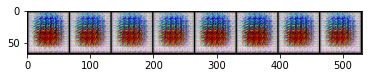

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:31  0.9895  0.0099  0.9945  ...    0.0023      0.64  0.1785

[1 rows x 10 columns], [([{'ROC': 0.9959370792587867, 'PR IN': 0.9978518219469074, 'PR OUT': 0.9804929138351173, 'MEAN REAL': 0.9857324957847595, 'MEAN FAKE': 0.5416748523712158}, {'ROC': 0.9725809594671203, 'PR IN': 0.9857060016135472, 'PR OUT': 0.9064074547870684, 'MEAN REAL': 0.9915919899940491, 'MEAN FAKE': 0.9270903468132019}, {'ROC': 0.9944362510629252, 'PR IN': 0.9970159263429965, 'PR OUT': 0.9745795914045987, 'MEAN REAL': 0.9908360242843628, 'MEAN FAKE': 0.6119071245193481}, {'ROC': 0.9957233870110545, 'PR IN': 0.9978194817977212, 'PR OUT': 0.9785275321208233, 'MEAN REAL': 0.9883635640144348, 'MEAN FAKE': 0.4554266929626465}, {'ROC': 0.9887551374716553, 'PR IN': 0.9943259108999536, 'PR OUT': 0.9500563031654727, 'MEAN REAL': 0.988196074962616, 'MEAN FAKE'

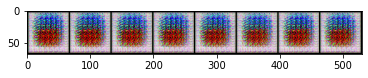

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                    ROC           PR IN  ... MEAN REAL MEAN FAKE        
                   mean     std    mean  ...       std      mean     std
Epoch:1, Batch:36  0.99  0.0046  0.9948  ...    0.0016    0.6158  0.1412

[1 rows x 10 columns], [([{'ROC': 0.9951897099985827, 'PR IN': 0.9974533180035534, 'PR OUT': 0.9811206106388588, 'MEAN REAL': 0.9866599440574646, 'MEAN FAKE': 0.4798012673854828}, {'ROC': 0.9916017839427438, 'PR IN': 0.9956487892568614, 'PR OUT': 0.9633414513073333, 'MEAN REAL': 0.9843271374702454, 'MEAN FAKE': 0.48322224617004395}, {'ROC': 0.9830707022392291, 'PR IN': 0.9911835673397683, 'PR OUT': 0.9350016416799519, 'MEAN REAL': 0.9886959791183472, 'MEAN FAKE': 0.8157719373703003}, {'ROC': 0.9883166808390023, 'PR IN': 0.9940907819462438, 'PR OUT': 0.9500567770729786, 'MEAN REAL': 0.9874010682106018, 'MEAN FAKE': 0.6757007241249084}, {'ROC': 0.991936716092687, 'PR IN': 0.9957401723704751, 'PR OUT': 0.9654396538295223, 'MEAN REAL': 0.9869096279144287, 'MEAN FAKE': 0.6

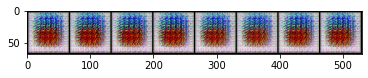

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC          PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std   mean  ...       std      mean     std
Epoch:1, Batch:41  0.9671  0.0297  0.983  ...    0.0061    0.7361  0.2574

[1 rows x 10 columns], [([{'ROC': 0.9991629464285714, 'PR IN': 0.9995435258540364, 'PR OUT': 0.9948561698685106, 'MEAN REAL': 0.9878994226455688, 'MEAN FAKE': 0.3893994092941284}, {'ROC': 0.9906230070153061, 'PR IN': 0.9950411992718006, 'PR OUT': 0.9623168709701575, 'MEAN REAL': 0.9860274791717529, 'MEAN FAKE': 0.5350735187530518}, {'ROC': 0.936949714781746, 'PR IN': 0.9675862234614805, 'PR OUT': 0.8240684384378723, 'MEAN REAL': 0.9738916754722595, 'MEAN FAKE': 0.8839544057846069}, {'ROC': 0.9354798885700113, 'PR IN': 0.9665288959922818, 'PR OUT': 0.8222186862021782, 'MEAN REAL': 0.9877270460128784, 'MEAN FAKE': 0.973128080368042}, {'ROC': 0.9730736695719956, 'PR IN': 0.9863762397304678, 'PR OUT': 0.9025836349800639, 'MEAN REAL': 0.9879377484321594, 'MEAN FAKE': 0.

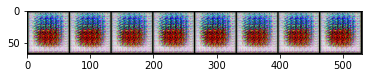

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:46  0.9877  0.0104  0.9937  ...    0.0022    0.6232  0.1765

[1 rows x 10 columns], [([{'ROC': 0.9912939785289114, 'PR IN': 0.9955507975480545, 'PR OUT': 0.9613504948175243, 'MEAN REAL': 0.9885767102241516, 'MEAN FAKE': 0.6919652223587036}, {'ROC': 0.9829727138251134, 'PR IN': 0.9914310150417359, 'PR OUT': 0.9313470056040217, 'MEAN REAL': 0.9854676723480225, 'MEAN FAKE': 0.7060601711273193}, {'ROC': 0.9951775306476758, 'PR IN': 0.9974795700830519, 'PR OUT': 0.979693229819995, 'MEAN REAL': 0.9896270632743835, 'MEAN FAKE': 0.48144224286079407}, {'ROC': 0.9717527636054422, 'PR IN': 0.9857019234936176, 'PR OUT': 0.8996609000459522, 'MEAN REAL': 0.9850165843963623, 'MEAN FAKE': 0.8338452577590942}, {'ROC': 0.9970680980725624, 'PR IN': 0.9983901966962088, 'PR OUT': 0.9858496759094095, 'MEAN REAL': 0.9892657995223999, 'MEAN FAKE

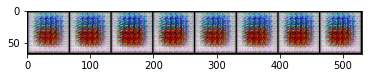

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:51  0.9873  0.0104  0.9934  ...    0.0014    0.6508  0.1895

[1 rows x 10 columns], [([{'ROC': 0.9769184692106009, 'PR IN': 0.9877783822636979, 'PR OUT': 0.9205072482184053, 'MEAN REAL': 0.9864765405654907, 'MEAN FAKE': 0.8199715614318848}, {'ROC': 0.9944556273030045, 'PR IN': 0.997069755255047, 'PR OUT': 0.9747301156669415, 'MEAN REAL': 0.9890947341918945, 'MEAN FAKE': 0.5375589728355408}, {'ROC': 0.9762087452168368, 'PR IN': 0.9878278202203653, 'PR OUT': 0.9128959938461942, 'MEAN REAL': 0.9864631295204163, 'MEAN FAKE': 0.8400052785873413}, {'ROC': 0.9994419642857142, 'PR IN': 0.9995696234304665, 'PR OUT': 0.999333816040858, 'MEAN REAL': 0.9883089065551758, 'MEAN FAKE': 0.3933546841144562}, {'ROC': 0.9896874114229026, 'PR IN': 0.9947859357232137, 'PR OUT': 0.9545118164422943, 'MEAN REAL': 0.989511251449585, 'MEAN FAKE': 

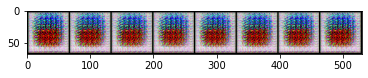

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                     ROC           PR IN  ... MEAN REAL MEAN FAKE        
                    mean     std    mean  ...       std      mean     std
Epoch:1, Batch:56  0.962  0.0493  0.9801  ...    0.0016    0.7936  0.1878

[1 rows x 10 columns], [([{'ROC': 0.8761783522002551, 'PR IN': 0.9346857582669089, 'PR OUT': 0.7290493154139168, 'MEAN REAL': 0.986275851726532, 'MEAN FAKE': 0.9869720339775085}, {'ROC': 0.96654332305839, 'PR IN': 0.9825897496738895, 'PR OUT': 0.8909425186123502, 'MEAN REAL': 0.9893432855606079, 'MEAN FAKE': 0.9453297853469849}, {'ROC': 0.9958850402140023, 'PR IN': 0.997827248534318, 'PR OUT': 0.9800171121899086, 'MEAN REAL': 0.9904033541679382, 'MEAN FAKE': 0.5775308012962341}, {'ROC': 0.9917529186153626, 'PR IN': 0.9958207075037211, 'PR OUT': 0.9617479947822942, 'MEAN REAL': 0.9880046248435974, 'MEAN FAKE': 0.6158711314201355}, {'ROC': 0.9798232444019275, 'PR IN': 0.9897347378400446, 'PR OUT': 0.9227045282644668, 'MEAN REAL': 0.9889230728149414, 'MEAN FAKE': 0.84

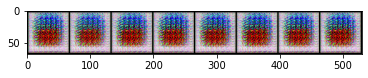

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:61  0.9873  0.0112  0.9935  ...    0.0024    0.7125  0.1321

[1 rows x 10 columns], [([{'ROC': 0.9681803385416666, 'PR IN': 0.983917659987204, 'PR OUT': 0.890309506561426, 'MEAN REAL': 0.9853433966636658, 'MEAN FAKE': 0.8874578475952148}, {'ROC': 0.9918497998157595, 'PR IN': 0.9958797187876687, 'PR OUT': 0.9622275661822888, 'MEAN REAL': 0.9909969568252563, 'MEAN FAKE': 0.718643844127655}, {'ROC': 0.9904989990787981, 'PR IN': 0.995050969379108, 'PR OUT': 0.9612956206338168, 'MEAN REAL': 0.987902045249939, 'MEAN FAKE': 0.6962134838104248}, {'ROC': 0.9974905001062924, 'PR IN': 0.9986811418507184, 'PR OUT': 0.9863743996675756, 'MEAN REAL': 0.990971565246582, 'MEAN FAKE': 0.5175420641899109}, {'ROC': 0.9885032463506236, 'PR IN': 0.9939822444414298, 'PR OUT': 0.9534390716823801, 'MEAN REAL': 0.9885534644126892, 'MEAN FAKE': 0.7

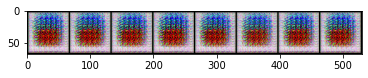

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:66  0.9875  0.0144  0.9936  ...    0.0026    0.6162  0.2368

[1 rows x 10 columns], [([{'ROC': 0.989941516971372, 'PR IN': 0.9947923284743949, 'PR OUT': 0.9573201572445761, 'MEAN REAL': 0.9873281121253967, 'MEAN FAKE': 0.6719221472740173}, {'ROC': 0.994090800382653, 'PR IN': 0.9969586655718927, 'PR OUT': 0.9717244711476316, 'MEAN REAL': 0.9846950769424438, 'MEAN FAKE': 0.4166780412197113}, {'ROC': 0.9918232266865079, 'PR IN': 0.9959016345941881, 'PR OUT': 0.9611855991283433, 'MEAN REAL': 0.9904510974884033, 'MEAN FAKE': 0.6948391199111938}, {'ROC': 0.9625136187287415, 'PR IN': 0.9807072730854599, 'PR OUT': 0.8783628008375282, 'MEAN REAL': 0.9880542159080505, 'MEAN FAKE': 0.943022608757019}, {'ROC': 0.9992559523809523, 'PR IN': 0.9996279761904762, 'PR OUT': 0.9949540649865446, 'MEAN REAL': 0.9911907911300659, 'MEAN FAKE': 

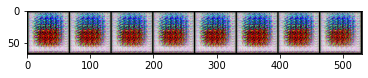

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC          PR IN  ... MEAN REAL MEAN FAKE        
                     mean    std    mean  ...       std      mean     std
Epoch:1, Batch:71  0.9835  0.009  0.9916  ...    0.0008    0.7266  0.1243

[1 rows x 10 columns], [([{'ROC': 0.9888392857142858, 'PR IN': 0.9944050582039209, 'PR OUT': 0.9500691315803165, 'MEAN REAL': 0.9873028993606567, 'MEAN FAKE': 0.6463254690170288}, {'ROC': 0.9803984419288547, 'PR IN': 0.9896496100030095, 'PR OUT': 0.9293307990502406, 'MEAN REAL': 0.9870126247406006, 'MEAN FAKE': 0.8181517720222473}, {'ROC': 0.9907752489016439, 'PR IN': 0.9953005751206089, 'PR OUT': 0.9578024461771164, 'MEAN REAL': 0.9889578223228455, 'MEAN FAKE': 0.6356152892112732}, {'ROC': 0.9886123069019274, 'PR IN': 0.9941477533063531, 'PR OUT': 0.9520937680516177, 'MEAN REAL': 0.9871427416801453, 'MEAN FAKE': 0.633116602897644}, {'ROC': 0.969108737244898, 'PR IN': 0.9842739443612174, 'PR OUT': 0.8935910233937001, 'MEAN REAL': 0.9869384765625, 'MEAN FAKE': 0.899

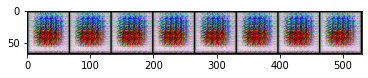

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:76  0.9874  0.0189  0.9935  ...    0.0014    0.5738  0.2646

[1 rows x 10 columns], [([{'ROC': 0.9857745181405895, 'PR IN': 0.9927668236380884, 'PR OUT': 0.94106326109638, 'MEAN REAL': 0.9878655672073364, 'MEAN FAKE': 0.7703899145126343}, {'ROC': 0.9552397782029478, 'PR IN': 0.9768956539977783, 'PR OUT': 0.8621078275193472, 'MEAN REAL': 0.9863808155059814, 'MEAN FAKE': 0.9296080470085144}, {'ROC': 0.9977678571428571, 'PR IN': 0.9988835131086679, 'PR OUT': 0.9867190080546092, 'MEAN REAL': 0.9890156984329224, 'MEAN FAKE': 0.40995535254478455}, {'ROC': 0.9999988927862812, 'PR IN': 0.9999988944314724, 'PR OUT': 0.9999988931978848, 'MEAN REAL': 0.987345278263092, 'MEAN FAKE': 0.30023929476737976}, {'ROC': 0.9984532224348073, 'PR IN': 0.9992013463534071, 'PR OUT': 0.9905902084536709, 'MEAN REAL': 0.9897958636283875, 'MEAN FAKE'

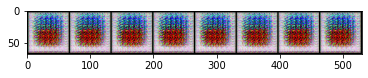

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:1958: UserWarning: reduction: 'mean' divides the total loss by both the batch size and the support size.'batchmean' divides only by the batch size, and aligns with the KL div math definition.'mean' will be changed to behave the same as 'batchmean' in the next major release.
  warnings.warn("reduction: 'mean' divides the total loss by both the batch size and the support size."



OOD PIPELINE



(                      ROC           PR IN  ... MEAN REAL MEAN FAKE        
                     mean     std    mean  ...       std      mean     std
Epoch:1, Batch:81  0.9635  0.0297  0.9812  ...    0.0031    0.8169  0.1685

[1 rows x 10 columns], [([{'ROC': 0.9467751293225624, 'PR IN': 0.9724509308638808, 'PR OUT': 0.844384043296761, 'MEAN REAL': 0.9849181771278381, 'MEAN FAKE': 0.9608993530273438}, {'ROC': 0.9940310108418368, 'PR IN': 0.9970035863286222, 'PR OUT': 0.9698115614888169, 'MEAN REAL': 0.9900855422019958, 'MEAN FAKE': 0.6077145934104919}, {'ROC': 0.9910653388959751, 'PR IN': 0.9955204245641074, 'PR OUT': 0.9581487836217312, 'MEAN REAL': 0.9882022738456726, 'MEAN FAKE': 0.6709067821502686}, {'ROC': 0.9241857550311791, 'PR IN': 0.9609746627099347, 'PR OUT': 0.800481688675821, 'MEAN REAL': 0.9858551025390625, 'MEAN FAKE': 0.9749730825424194}, {'ROC': 0.9615373330321711, 'PR IN': 0.980247489362774, 'PR OUT': 0.8766389266239136, 'MEAN REAL': 0.9818708300590515, 'MEAN FAKE': 

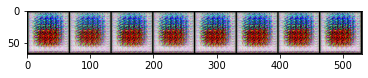


EPOCH COMPLETE
[2] discriminator loss: -1.770
[2] generator loss: -4.790
[2] classifier loss: 0.074
Classifier accuracy on GAN: 0.05514705882352941 Activation: 0.8937569260597229


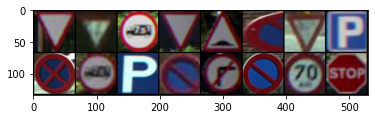

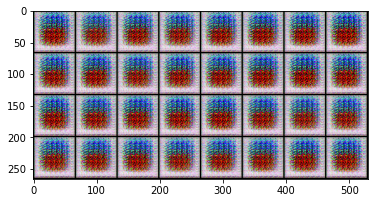

In [0]:
import pandas as pd

for i in range(3):
    n = 2
    print("Training baseline")
    baseline_classifier = getOODBaselineClassifier()
    print("Init GAN")
    generator, g_optimizer, discriminator, d_optimizer, classifier, c_optimizer = initGAN(conditional=True, lee=True, wgan=True)
    print("Train GAN")
    res, _, ood_res = trainGAN_whileTesting(generator, g_optimizer, discriminator, d_optimizer, n, classifier=classifier, c_optimizer=c_optimizer, baseline=baseline_classifier, use_baseline=True, conditional=True, sricharan=True, lee=True, wgan=True, early_stopping=1, classifier_stopping=-1)

    pd.concat(ood_res)
    res_path = DRIVE_PATH + 'Results/gan_combined_training_results_' + str(i+2) + '.p'
    utils.save_results(ood_res, res_path)

In [0]:
import pandas as pd
pd.concat(ood_res)

res_path = DRIVE_PATH + 'Results/gan_combined_training_results_2.p'
utils.save_results(ood_res, res_path)